In [ ]:
# Set up for Twitter web scraping.

In [2]:
import requests
import pandas as pd

In [2]:
try:
    from requests_oauthlib import OAuth1
except ModuleNotFoundError:
    import sys
    import os

    sys.path.append('/usr/local/lib/python3.6/site-packages')
    from requests_oauthlib import OAuth1

In [3]:
from twitter_credentials import credentials

In [4]:
oauth = OAuth1(credentials["TWITTER_CONSUMER_KEY"],
               credentials["TWITTER_CONSUMER_KEY_SECRET"],
               credentials["TWITTER_ACCESS_TOKEN"],
               credentials["TWITTER_ACCESS_TOKEN_SECRET"])

In [5]:
# Testing Twitter API on my own account (which has no tweets).
response = requests.get("https://api.twitter.com/1.1/statuses/user_timeline.json",
                        auth=oauth)

tweets = response.json()

import pprint
pprint.pprint(tweets)

[]


In [156]:
def tweet_to_dict(tweet): # Create function for saving relevant tweet info in dictionary format.
    tweet_dict={
        "Tweet body": tweet['full_text'],
        "Hashtags": tweet['entities']['hashtags'],
        "Username": tweet['user']['screen_name'],
        "Bio": tweet['user']['description'],
        "Friends": tweet['user']['friends_count'],
        "Followers": tweet['user']['followers_count'],
        "Location": tweet['user']['location'],
        "Time": tweet['created_at'],
        "Idn": tweet['id']
    }
    return tweet_dict

In [157]:
tweet_list = [] # Create empty list for storing tweet dictionaries.

In [ ]:
# start id: 1,059,596,220,564,422,659
# end id:   1,059,958,608,442,535,936

In [158]:
parameters = {"q": "vote", "count": 100, "since_id": "1059596220564422659", "max_id": "1059837812000000000", 
              "lang": "en", "tweet_mode": "extended"} # Pull sample of tweets with "vote" from election day.

response = requests.get("https://api.twitter.com/1.1/search/tweets.json",
                        params = parameters,
                        auth=oauth)

In [159]:
tweets = response.json()
pprint.pprint(tweets)

{'search_metadata': {'completed_in': 0.099,
                     'count': 100,
                     'max_id': 1059837812000000000,
                     'max_id_str': '1059837812000000000',
                     'next_results': '?max_id=1059837808351809536&q=vote&lang=en&count=100&include_entities=1',
                     'query': 'vote',
                     'refresh_url': '?since_id=1059837812000000000&q=vote&lang=en&include_entities=1',
                     'since_id': 1059596220564422659,
                     'since_id_str': '1059596220564422659'},
 'statuses': [{'contributors': None,
               'coordinates': None,
               'created_at': 'Tue Nov 06 15:59:59 +0000 2018',
               'display_text_range': [0, 27],
               'entities': {'hashtags': [{'indices': [15, 27],
                                          'text': 'ElectionDay'}],
                            'symbols': [],
                            'urls': [],
                            'user_mentions': []}

                        'lang': 'en',
                        'listed_count': 0,
                        'location': '',
                        'name': 'mehar',
                        'notifications': False,
                        'profile_background_color': 'F5F8FA',
                        'profile_background_image_url': None,
                        'profile_background_image_url_https': None,
                        'profile_background_tile': False,
                        'profile_banner_url': 'https://pbs.twimg.com/profile_banners/896511117853437953/1516231476',
                        'profile_image_url': 'http://pbs.twimg.com/profile_images/1027066430972407808/UssJwoEn_normal.jpg',
                        'profile_image_url_https': 'https://pbs.twimg.com/profile_images/1027066430972407808/UssJwoEn_normal.jpg',
                        'profile_link_color': '1DA1F2',
                        'profile_sidebar_border_color': 'C0DEED',
                        'profile_sidebar_fill_

                                                 'medium': {'h': 615,
                                                            'resize': 'fit',
                                                            'w': 1200},
                                                 'small': {'h': 349,
                                                           'resize': 'fit',
                                                           'w': 680},
                                                 'thumb': {'h': 150,
                                                           'resize': 'crop',
                                                           'w': 150}},
                                       'source_status_id': 1059809602093629441,
                                       'source_status_id_str': '1059809602093629441',
                                       'source_user_id': 39344374,
                                       'source_user_id_str': '39344374',
                                       'typ

                                             'entities': {'description': {'urls': []}},
                                             'favourites_count': 11534,
                                             'follow_request_sent': False,
                                             'followers_count': 13291,
                                             'following': False,
                                             'friends_count': 137,
                                             'geo_enabled': False,
                                             'has_extended_profile': False,
                                             'id': 3168110251,
                                             'id_str': '3168110251',
                                             'is_translation_enabled': False,
                                             'is_translator': False,
                                             'lang': 'en',
                                             'listed_count': 155,
               

                                                 'user_mentions': []},
                                    'favorite_count': 29435,
                                    'favorited': False,
                                    'full_text': 'Voting should be easy. If it '
                                                 "isn't, call the Election "
                                                 'Protection hotline at '
                                                 '866-OUR-VOTE with any '
                                                 'questions. '
                                                 'https://t.co/LFyaclyrz2',
                                    'geo': None,
                                    'id': 1059830716513554432,
                                    'id_str': '1059830716513554432',
                                    'in_reply_to_screen_name': None,
                                    'in_reply_to_status_id': None,
                                    'in_reply_to_s

                                                 'result_type': 'recent'},
                                    'place': None,
                                    'possibly_sensitive': False,
                                    'retweet_count': 823,
                                    'retweeted': False,
                                    'source': '<a href="http://gainapp.com" '
                                              'rel="nofollow">Gain App</a>',
                                    'truncated': False,
                                    'user': {'contributors_enabled': False,
                                             'created_at': 'Sun Jan 15 '
                                                           '22:17:54 +0000 '
                                                           '2012',
                                             'default_profile': False,
                                             'default_profile_image': False,
                                           

                        'followers_count': 173,
                        'following': False,
                        'friends_count': 526,
                        'geo_enabled': True,
                        'has_extended_profile': True,
                        'id': 708823392250531841,
                        'id_str': '708823392250531841',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'en',
                        'listed_count': 4,
                        'location': 'Greece, NY',
                        'name': 'Tanya',
                        'notifications': False,
                        'profile_background_color': 'F5F8FA',
                        'profile_background_image_url': None,
                        'profile_background_image_url_https': None,
                        'profile_background_tile': False,
                        'profile_image_url': 'http://pbs.twimg.com/profile_images/

                                       'humans.',
                        'entities': {'description': {'urls': []}},
                        'favourites_count': 6360,
                        'follow_request_sent': False,
                        'followers_count': 100,
                        'following': False,
                        'friends_count': 107,
                        'geo_enabled': False,
                        'has_extended_profile': False,
                        'id': 89848507,
                        'id_str': '89848507',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'en',
                        'listed_count': 1,
                        'location': '',
                        'name': 'Mojo',
                        'notifications': False,
                        'profile_background_color': 'C0DEED',
                        'profile_background_image_url': 'http://abs.twimg.com/

                                                                                         'resize': 'crop',
                                                                                         'w': 150}},
                                                                     'type': 'photo',
                                                                     'url': 'https://t.co/eU6qBf976E'},
                                                                    {'display_url': 'pic.twitter.com/eU6qBf976E',
                                                                     'expanded_url': 'https://twitter.com/CoryBooker/status/1059835777440534528/photo/1',
                                                                     'id': 1059835773665579010,
                                                                     'id_str': '1059835773665579010',
                                                                     'indices': [235,
                                                  

                        'id_str': '744212681905872896',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'en',
                        'listed_count': 0,
                        'location': 'Connersville, IN',
                        'name': 'TonyaAnn James-Smith',
                        'notifications': False,
                        'profile_background_color': 'F5F8FA',
                        'profile_background_image_url': None,
                        'profile_background_image_url_https': None,
                        'profile_background_tile': False,
                        'profile_banner_url': 'https://pbs.twimg.com/profile_banners/744212681905872896/1466271160',
                        'profile_image_url': 'http://pbs.twimg.com/profile_images/744221308469280768/Cyl2awKz_normal.jpg',
                        'profile_image_url_https': 'https://pbs.twimg.com/profile_images/744221308469280768/

                            'urls': [],
                            'user_mentions': [{'id': 617266600,
                                               'id_str': '617266600',
                                               'indices': [27, 41],
                                               'name': 'Katie Porter',
                                               'screen_name': 'katieporteroc'}]},
               'favorite_count': 0,
               'favorited': False,
               'full_text': 'I proudly cast my vote for @katieporteroc this '
                            'morning! Let’s flip the 45th!',
               'geo': None,
               'id': 1059837810700505088,
               'id_str': '1059837810700505088',
               'in_reply_to_screen_name': None,
               'in_reply_to_status_id': None,
               'in_reply_to_status_id_str': None,
               'in_reply_to_user_id': None,
               'in_reply_to_user_id_str': None,
               'is_quote_status': False,


                                                         'believe critical '
                                                         'thinking to be '
                                                         'crucial to '
                                                         'development.\n'
                                                         '#RESIST',
                                          'entities': {'description': {'urls': []}},
                                          'favourites_count': 28463,
                                          'follow_request_sent': False,
                                          'followers_count': 12313,
                                          'following': False,
                                          'friends_count': 7794,
                                          'geo_enabled': True,
                                          'has_extended_profile': False,
                                          'id': 129281932,
                   

               'display_text_range': [0, 228],
               'entities': {'hashtags': [{'indices': [6, 18],
                                          'text': 'ElectionDay'},
                                         {'indices': [177, 184],
                                          'text': 'IVoted'},
                                         {'indices': [185, 201],
                                          'text': 'VoteForOurLives'},
                                         {'indices': [202, 211],
                                          'text': 'VoteBlue'}],
                            'media': [{'display_url': 'pic.twitter.com/6w3IAbw7T7',
                                       'expanded_url': 'https://twitter.com/leveecranes/status/1059837810193113089/photo/1',
                                       'id': 1059837806141431808,
                                       'id_str': '1059837806141431808',
                                       'indices': [229, 252],
                          

                                    'retweet_count': 937,
                                    'retweeted': False,
                                    'source': '<a href="http://twitter.com" '
                                              'rel="nofollow">Twitter Web '
                                              'Client</a>',
                                    'truncated': False,
                                    'user': {'contributors_enabled': False,
                                             'created_at': 'Wed May 02 '
                                                           '04:00:08 +0000 '
                                                           '2012',
                                             'default_profile': False,
                                             'default_profile_image': False,
                                             'description': 'Vocal Top '
                                                            'SSBM/DBFZ '
                             

                                      'expanded_url': 'https://www.thewrap.com/stranger-things-star-david-harbour-uses-jaws-2-to-explain-why-you-should-vote-photo/',
                                      'indices': [85, 108],
                                      'url': 'https://t.co/ASc7uq8j2B'}],
                            'user_mentions': [{'id': 2784747340,
                                               'id_str': '2784747340',
                                               'indices': [3, 14],
                                               'name': 'Geek.0',
                                               'screen_name': 'geekpoint0'}]},
               'favorite_count': 0,
               'favorited': False,
               'full_text': "RT @geekpoint0: 'Stranger Things' Star David "
                            "Harbour Uses 'Jaws 2' to Explain Voting "
                            'https://t.co/ASc7uq8j2B',
               'geo': None,
               'id': 1059837810071334912,
          

               'retweeted_status': {'contributors': None,
                                    'coordinates': None,
                                    'created_at': 'Tue Nov 06 13:05:22 +0000 '
                                                  '2018',
                                    'display_text_range': [0, 259],
                                    'entities': {'hashtags': [{'indices': [197,
                                                                           203],
                                                               'text': 'LGBTQ'},
                                                              {'indices': [247,
                                                                           259],
                                                               'text': 'ElectionDay'}],
                                                 'symbols': [],
                                                 'urls': [],
                                                 'user_mentions'

                                             'default_profile': True,
                                             'default_profile_image': False,
                                             'description': 'Cartoonist and '
                                                            'Illustrator',
                                             'entities': {'description': {'urls': []},
                                                          'url': {'urls': [{'display_url': 'tilliewalden.com',
                                                                            'expanded_url': 'http://tilliewalden.com',
                                                                            'indices': [0,
                                                                                        23],
                                                                            'url': 'https://t.co/zQTgmuL76Q'}]}},
                                             'favourites_count': 28546,
             

               'favorited': False,
               'full_text': 'RT @SheaSerrano: LET’S\n'
                            'FUCKING\n'
                            'GOOOOOOOOOOO \n'
                            '🗣🗣🗣\n'
                            '\n'
                            'VOTE BETO https://t.co/QaXY5d7sNC',
               'geo': None,
               'id': 1059837809706577921,
               'id_str': '1059837809706577921',
               'in_reply_to_screen_name': None,
               'in_reply_to_status_id': None,
               'in_reply_to_status_id_str': None,
               'in_reply_to_user_id': None,
               'in_reply_to_user_id_str': None,
               'is_quote_status': False,
               'lang': 'en',
               'metadata': {'iso_language_code': 'en', 'result_type': 'recent'},
               'place': None,
               'possibly_sensitive': False,
               'retweet_count': 652,
               'retweeted': False,
               'retweeted_status': {'co

                        'statuses_count': 2851,
                        'time_zone': None,
                        'translator_type': 'none',
                        'url': None,
                        'utc_offset': None,
                        'verified': False}},
              {'contributors': None,
               'coordinates': None,
               'created_at': 'Tue Nov 06 15:59:59 +0000 2018',
               'display_text_range': [0, 32],
               'entities': {'hashtags': [],
                            'symbols': [],
                            'urls': [],
                            'user_mentions': []},
               'favorite_count': 0,
               'favorited': False,
               'full_text': 'if u dont vote dem ur moms a hoe',
               'geo': None,
               'id': 1059837809383694336,
               'id_str': '1059837809383694336',
               'in_reply_to_screen_name': None,
               'in_reply_to_status_id': None,
               'in_reply_t

                        'entities': {'description': {'urls': []},
                                     'url': {'urls': [{'display_url': 'hopelesslywanderlust.wordpress.com',
                                                       'expanded_url': 'http://hopelesslywanderlust.wordpress.com/',
                                                       'indices': [0, 23],
                                                       'url': 'https://t.co/11NEtvS0Jj'}]}},
                        'favourites_count': 28442,
                        'follow_request_sent': False,
                        'followers_count': 574,
                        'following': False,
                        'friends_count': 788,
                        'geo_enabled': False,
                        'has_extended_profile': False,
                        'id': 23423222,
                        'id_str': '23423222',
                        'is_translation_enabled': False,
                        'is_translator': False,
      

                                    'possibly_sensitive': False,
                                    'retweet_count': 272,
                                    'retweeted': False,
                                    'source': '<a '
                                              'href="http://twitter.com/download/iphone" '
                                              'rel="nofollow">Twitter for '
                                              'iPhone</a>',
                                    'truncated': False,
                                    'user': {'contributors_enabled': False,
                                             'created_at': 'Wed Dec 19 '
                                                           '19:53:42 +0000 '
                                                           '2007',
                                             'default_profile': False,
                                             'default_profile_image': False,
                                             

                        'default_profile_image': False,
                        'description': 'Mother of 3 great kids. Grandma x2, '
                                       'Registered Nurse. Got Sisu! Spoonie, '
                                       'RA/OA, farm girl. Love people, music, '
                                       'nature. #resistance',
                        'entities': {'description': {'urls': []}},
                        'favourites_count': 74677,
                        'follow_request_sent': False,
                        'followers_count': 3149,
                        'following': False,
                        'friends_count': 4800,
                        'geo_enabled': True,
                        'has_extended_profile': False,
                        'id': 893331068,
                        'id_str': '893331068',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'en',
  

                        'description': "Someone told me there's a girl out "
                                       'there with love in her eyes and '
                                       'flowers in her hair.',
                        'entities': {'description': {'urls': []}},
                        'favourites_count': 5359,
                        'follow_request_sent': False,
                        'followers_count': 125,
                        'following': False,
                        'friends_count': 388,
                        'geo_enabled': False,
                        'has_extended_profile': False,
                        'id': 2200634023,
                        'id_str': '2200634023',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'en',
                        'listed_count': 3,
                        'location': 'Wherever the food is. ',
                        'name': 'Meagh

                                          'text': 'Beto2018'}],
                            'symbols': [],
                            'urls': [],
                            'user_mentions': [{'id': 2765204747,
                                               'id_str': '2765204747',
                                               'indices': [3, 17],
                                               'name': 'Clarissa Escobar ☀️',
                                               'screen_name': 'clarissaescoo'}]},
               'favorite_count': 0,
               'favorited': False,
               'full_text': 'RT @clarissaescoo: IT IS ELECTION DAY‼️ we still '
                            'have time! If you haven’t gone to vote we have 11 '
                            'hours left! #ElectionDay2018 #Beto2018 l…',
               'geo': None,
               'id': 1059837808972566529,
               'id_str': '1059837808972566529',
               'in_reply_to_screen_name': None,
               'in_

                        'profile_image_url': 'http://pbs.twimg.com/profile_images/936584178488897536/l29BrqC1_normal.jpg',
                        'profile_image_url_https': 'https://pbs.twimg.com/profile_images/936584178488897536/l29BrqC1_normal.jpg',
                        'profile_link_color': '1DA1F2',
                        'profile_sidebar_border_color': 'C0DEED',
                        'profile_sidebar_fill_color': 'DDEEF6',
                        'profile_text_color': '333333',
                        'profile_use_background_image': True,
                        'protected': False,
                        'screen_name': 'seawiz2',
                        'statuses_count': 85414,
                        'time_zone': None,
                        'translator_type': 'none',
                        'url': None,
                        'utc_offset': None,
                        'verified': False}},
              {'contributors': None,
               'coordinates': None,
       

                                             'profile_image_url': 'http://pbs.twimg.com/profile_images/961462238732275712/omWV1cZs_normal.jpg',
                                             'profile_image_url_https': 'https://pbs.twimg.com/profile_images/961462238732275712/omWV1cZs_normal.jpg',
                                             'profile_link_color': '0084B4',
                                             'profile_sidebar_border_color': 'C0DEED',
                                             'profile_sidebar_fill_color': 'DDEEF6',
                                             'profile_text_color': '333333',
                                             'profile_use_background_image': True,
                                             'protected': False,
                                             'screen_name': 'kylegriffin1',
                                             'statuses_count': 43325,
                                             'time_zone': None,
                     

                        'id': 1932716539,
                        'id_str': '1932716539',
                        'is_translation_enabled': False,
                        'is_translator': False,
                        'lang': 'fr',
                        'listed_count': 4,
                        'location': 'Canada, sorry.',
                        'name': 'bitch i’m',
                        'notifications': False,
                        'profile_background_color': '000000',
                        'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png',
                        'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png',
                        'profile_background_tile': False,
                        'profile_banner_url': 'https://pbs.twimg.com/profile_banners/1932716539/1495388717',
                        'profile_image_url': 'http://pbs.twimg.com/profile_images/839235119550513153/M0cWv5f1_normal.jpg',
  

                                             'profile_banner_url': 'https://pbs.twimg.com/profile_banners/3389339289/1530458229',
                                             'profile_image_url': 'http://pbs.twimg.com/profile_images/1059180223827230730/gm0YBmFY_normal.jpg',
                                             'profile_image_url_https': 'https://pbs.twimg.com/profile_images/1059180223827230730/gm0YBmFY_normal.jpg',
                                             'profile_link_color': '1DA1F2',
                                             'profile_sidebar_border_color': 'C0DEED',
                                             'profile_sidebar_fill_color': 'DDEEF6',
                                             'profile_text_color': '333333',
                                             'profile_use_background_image': True,
                                             'protected': False,
                                             'screen_name': 'XXANAAGUILARXX',
                     

In [160]:
tweets = response.json()['statuses']

for tweet in tweets:
    tweet_list.append(tweet_to_dict(tweet)) # Add tweet info dictionaries to list.

In [161]:
pprint.pprint(tweet_list)

[{'Bio': '25. black. female. fangirl. registered nurse. sad princess. '
         'catholic. woke. // #BLACKLIVESMATTER #NEVERAGAIN',
  'Followers': 136,
  'Friends': 788,
  'Hashtags': [{'indices': [15, 27], 'text': 'ElectionDay'}],
  'Idn': 1059837811887693824,
  'Location': 'Rochester, NY',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Tweet body': 'Vote, bitches. #ElectionDay',
  'Username': 'chillwavebunny'},
 {'Bio': '"I carry your ❤️ with me, I carry it in my ❤️" ~E.E.Cummings~🇺🇸 '
         '#MAGA 🇺🇸 #TRUMP2020 🚂#WWG1WGA #WalkAway 🇺🇸 F/B: Scaramucci, General '
         'Flynn & Alveda King',
  'Followers': 15577,
  'Friends': 15131,
  'Hashtags': [],
  'Idn': 1059837811883474947,
  'Location': '',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Tweet body': 'RT @LindaMaryGG: To all my fellow New Jersians.....PLEASE, '
                'PLEASE, if you do nothing else, get out today and vote RED! '
                'https://t.co/3IvfX3D…',
  'Username': 'LindaMaryGG'},
 {'Bio': 'hi i

  'Idn': 1059837809110863872,
  'Location': '',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Tweet body': 'RT @Gngerbrdgrl: Vote Red Today! The United States of America '
                'Stands! We are the people that love our freedom and our way '
                'of life. We will…',
  'Username': 'Jolyd'},
 {'Bio': 'mother, wife, volunteer, small business owner and I VOTE!',
  'Followers': 274,
  'Friends': 488,
  'Hashtags': [],
  'Idn': 1059837809035485190,
  'Location': 'Virginia, USA',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Tweet body': 'RT @kurtewolfe: Greeted voters at the polls for 3 1/2 hours '
                'this morning to help @SpanbergerVA07 flip the 7th. Despite '
                'the drizzle, there w…',
  'Username': 'sjjw2'},
 {'Bio': "Someone told me there's a girl out there with love in her eyes and "
         'flowers in her hair.',
  'Followers': 125,
  'Friends': 388,
  'Hashtags': [],
  'Idn': 1059837809027149825,
  'Location': 'Wherever the food is.

In [162]:
print("Number of tweets = ", len(tweet_list))

Number of tweets =  100


In [163]:
# Loop through next page of tweets until API stops working (typically after ~179 requests).
for i in range(1000):
    next_page_url = "https://api.twitter.com/1.1/search/tweets.json" + response.json()['search_metadata']['next_results']
    response = requests.get(next_page_url, params = parameters, auth=oauth)
    tweets = response.json()['statuses']
    for tweet in tweets:
        tweet_list.append(tweet_to_dict(tweet))

KeyError: 'statuses'

In [164]:
print("Number of tweets = ", len(tweet_list))

Number of tweets =  18000


In [165]:
for i in range(-1,-101,-1): # Print the final 100 tweets to see how far it got.
    print(tweet_list[i])
    print()

{'Tweet body': 'RT @tegantegan: INSTEAD OF BLAMING PEOPLE OF COLOR WHO DON’T VOTE, WHITE LIBERALS NEED TO TAKE A CLOSER LOOK AT THEIR OWN COMMUNITIES. \n\nHo…', 'Hashtags': [], 'Username': 'sage_ssf', 'Bio': "Ideal world: I'd  spend my days SoulLineDancing, Zumba'g, Pinterestg, cookg, shoppg & readg w/my toes in the sand. Real World: Get up, Stand up, Speak up!", 'Friends': 343, 'Followers': 381, 'Location': 'Pennsylvania', 'Time': 'Tue Nov 06 15:57:26 +0000 2018', 'Idn': 1059837167093145600}

{'Tweet body': 'This happened in my lifetime and I am still young enough to remember the details. Never again people. Never again! VOTE https://t.co/n5Oows1kKk', 'Hashtags': [], 'Username': 'Doodle102', 'Bio': 'Ornament designer, novice writer, animal lover, environmentalist, patriot, loves black history, fighter for rights, and yes, Black Lives Matter!', 'Friends': 494, 'Followers': 254, 'Location': 'United States', 'Time': 'Tue Nov 06 15:57:26 +0000 2018', 'Idn': 1059837167109898241}

{'Tweet b

In [ ]:
# Set up Mongo DB via Python to store tweet data.

In [36]:
import json
from pymongo import MongoClient

In [37]:
client = MongoClient()
db = client.vote

In [19]:
'''db.create_collection('tweet_list')'''

"db.create_collection('tweet_list')"

In [38]:
col = db.get_collection('tweet_list')

In [22]:
'''for i in range(18000):
    col.insert_one(tweet_list[i])'''

'for i in range(18000):\n    col.insert_one(tweet_list[i])'

In [39]:
col.count()

18000

In [40]:
for doc in col.find():
    print(doc)
    print()

{'_id': ObjectId('5be8bcda64d4521363a25401'), 'Tweet body': 'Vote, bitches. #ElectionDay', 'Hashtags': [{'text': 'ElectionDay', 'indices': [15, 27]}], 'Username': 'chillwavebunny', 'Bio': '25. black. female. fangirl. registered nurse. sad princess. catholic. woke. // #BLACKLIVESMATTER #NEVERAGAIN', 'Friends': 788, 'Followers': 136, 'Location': 'Rochester, NY', 'Time': 'Tue Nov 06 15:59:59 +0000 2018', 'Idn': 1059837811887693824}

{'_id': ObjectId('5be8bcda64d4521363a25402'), 'Tweet body': 'RT @LindaMaryGG: To all my fellow New Jersians.....PLEASE, PLEASE, if you do nothing else, get out today and vote RED! https://t.co/3IvfX3D…', 'Hashtags': [], 'Username': 'LindaMaryGG', 'Bio': '"I carry your ❤️ with me, I carry it in my ❤️" ~E.E.Cummings~🇺🇸 #MAGA 🇺🇸 #TRUMP2020 🚂#WWG1WGA #WalkAway 🇺🇸 F/B: Scaramucci, General Flynn & Alveda King', 'Friends': 15131, 'Followers': 15577, 'Location': '', 'Time': 'Tue Nov 06 15:59:59 +0000 2018', 'Idn': 1059837811883474947}

{'_id': ObjectId('5be8bcda64d452

{'_id': ObjectId('5be8bcda64d4521363a25466'), 'Tweet body': 'RT @NateWantsToBtl: I mean... you don’t have to vote... but you’d really be upsetting Rylo. Idk if you want that on your conscience. https:…', 'Hashtags': [], 'Username': 'talkfastconnor', 'Bio': '+ you got a boyfriend, i bet he doesn’t kiss ya. mwah. @diceydarkiplier', 'Friends': 159, 'Followers': 231, 'Location': 'He/him|7.10.18', 'Time': 'Tue Nov 06 15:59:58 +0000 2018', 'Idn': 1059837808280358917}

{'_id': ObjectId('5be8bcda64d4521363a25467'), 'Tweet body': 'RT @robreiner: Today America will decide if Democracy survives. VOTE!', 'Hashtags': [], 'Username': 'craigmatsuda', 'Bio': "Journalist, Teacher, Administrator, Mischief Maker. Opinions mine; retweets aren't an endorsement of others' views.", 'Friends': 781, 'Followers': 743, 'Location': 'Los Angeles', 'Time': 'Tue Nov 06 15:59:58 +0000 2018', 'Idn': 1059837808221675520}

{'_id': ObjectId('5be8bcda64d4521363a25468'), 'Tweet body': '@KEEMSTAR No vote UKIP 🇬🇧 🏴\U000e0067

{'_id': ObjectId('5be8bcdb64d4521363a2586a'), 'Tweet body': "RT @JohnFugelsang: In which Ann imagines an America where 4 out of 5 Trump children can't vote. https://t.co/odvwjmjGTp", 'Hashtags': [], 'Username': 'kevindotcole', 'Bio': '@theannualtweets, @WeeklyHumorist, @thisisRobotButt writer. Showrunner @lasthurrahlive & #GoodTimesShow, @METComedyNight. He/Him', 'Friends': 727, 'Followers': 678, 'Location': 'Mt. Airy, MD', 'Time': 'Tue Nov 06 15:59:50 +0000 2018', 'Idn': 1059837770980564994}

{'_id': ObjectId('5be8bcdb64d4521363a2586b'), 'Tweet body': 'RT @kylegriffin1: "I heard people were making racist robocalls in my name against Stacey Abrams, who I am one hundred percent for, in Georg…', 'Hashtags': [], 'Username': 'marilyn29725359', 'Bio': '', 'Friends': 116, 'Followers': 400, 'Location': '', 'Time': 'Tue Nov 06 15:59:50 +0000 2018', 'Idn': 1059837770904952832}

{'_id': ObjectId('5be8bcdb64d4521363a2586c'), 'Tweet body': 'RT @GoodmanHoops: Vote. Vote. Vote. \n\nAnd then watch so


{'_id': ObjectId('5be8bcdb64d4521363a25c52'), 'Tweet body': 'RT @TaePhoenix: 🤖 If the voting machines are behaving strangely (like, for example, changing your vote to another candidate on the confirma…', 'Hashtags': [], 'Username': 'queridapatricia', 'Bio': 'Feminista. In Buenos Aires I became an adult and a senior editor. In NY, a digital media/strategy person. Have traveled. Brooklyn is home+inspiration. #StopHate', 'Friends': 1352, 'Followers': 2024, 'Location': 'Brooklyn', 'Time': 'Tue Nov 06 15:59:41 +0000 2018', 'Idn': 1059837733634523136}

{'_id': ObjectId('5be8bcdb64d4521363a25c53'), 'Tweet body': 'RT @Comey: Voted. Now going out to knock on doors to urge everyone to vote.  Should be fun. https://t.co/xvofJXSPb9', 'Hashtags': [], 'Username': 'kmurphysteele', 'Bio': '', 'Friends': 377, 'Followers': 31, 'Location': 'Austin, TX', 'Time': 'Tue Nov 06 15:59:41 +0000 2018', 'Idn': 1059837733596774401}

{'_id': ObjectId('5be8bcdb64d4521363a25c54'), 'Tweet body': 'PLEASE VOTE', 'Hasht

{'_id': ObjectId('5be8bcdb64d4521363a26039'), 'Tweet body': 'RT @jk_rowling: “When words stop meaning anything, when people can just make stuff up and there’s no consequences, democracy can’t work. Th…', 'Hashtags': [], 'Username': 'AnnaDol20230332', 'Bio': "I'm unusual", 'Friends': 370, 'Followers': 175, 'Location': 'United Kingdom', 'Time': 'Tue Nov 06 15:59:32 +0000 2018', 'Idn': 1059837697970372608}

{'_id': ObjectId('5be8bcdb64d4521363a2603a'), 'Tweet body': 'RT @BrianDawkins: The time for talking is done... Let your actions speak LOUDEST!! PLEASE VOTE!! 🙏🏽 https://t.co/mIqk2DMvQI', 'Hashtags': [], 'Username': 'Turd_Ferguson22', 'Bio': 'Husband, father to HIGH QUALITY kids, fantasy football guru, sports memorabilia tycoon. NOT a Colangelo burner account. #Eagles #Phillies #Flyers #Sixers #SB52', 'Friends': 1999, 'Followers': 1503, 'Location': '', 'Time': 'Tue Nov 06 15:59:32 +0000 2018', 'Idn': 1059837697966120961}

{'_id': ObjectId('5be8bcdb64d4521363a2603b'), 'Tweet body': 'RT @

{'_id': ObjectId('5be8bcdc64d4521363a26421'), 'Tweet body': 'RT @TishJames: We made it to #ElectionDay!\n\nWe can make history here in New York and across the entire nation today, but you have to go vot…', 'Hashtags': [{'text': 'ElectionDay', 'indices': [29, 41]}], 'Username': 'JacquiYoungL', 'Bio': 'Cancer Survivor, @BrooksJasonW, Democracy Defender, Wellness Expert ❄️📎🗽🇵🇷🌈🌊 #UNMAlumni #CNMAlumni #Vote2018 #YoungLiving', 'Friends': 5002, 'Followers': 2314, 'Location': 'Las Vegas, NM', 'Time': 'Tue Nov 06 15:59:24 +0000 2018', 'Idn': 1059837664193474560}

{'_id': ObjectId('5be8bcdc64d4521363a26422'), 'Tweet body': "@dukeblazer “y'all need to go out and find a spine instead of vote” maybe I’m misinterpreting that?", 'Hashtags': [], 'Username': 'ChanelE4stCoast', 'Bio': "I'm too deep in this thang", 'Friends': 195, 'Followers': 667, 'Location': 'Atlanta, GA', 'Time': 'Tue Nov 06 15:59:24 +0000 2018', 'Idn': 1059837664151642114}

{'_id': ObjectId('5be8bcdc64d4521363a26423'), 'Tweet body':


{'_id': ObjectId('5be8bcdc64d4521363a26809'), 'Tweet body': "I may have early voted last week, but that doesn't mean I can't post the picture now! Go Vote! #yourvoicematters #ohiovoting https://t.co/nOiSpsypYy", 'Hashtags': [{'text': 'yourvoicematters', 'indices': [95, 112]}, {'text': 'ohiovoting', 'indices': [113, 124]}], 'Username': 'Samminger', 'Bio': '🦇🌹🤡🌙', 'Friends': 128, 'Followers': 154, 'Location': 'Ohio', 'Time': 'Tue Nov 06 15:59:16 +0000 2018', 'Idn': 1059837629410304001}

{'_id': ObjectId('5be8bcdc64d4521363a2680a'), 'Tweet body': 'RT @SarahKSilverman: Don’t let this bully intimidate you. Voting is your RIGHT if anyone gives you trouble at the polls call 866-OUR-VOTE a…', 'Hashtags': [], 'Username': 'dmannino98', 'Bio': "Dom/ Southgate/ you'll always catch me in a sweater and up til' 2am", 'Friends': 622, 'Followers': 216, 'Location': 'Southgate, MI', 'Time': 'Tue Nov 06 15:59:16 +0000 2018', 'Idn': 1059837629347364864}

{'_id': ObjectId('5be8bcdc64d4521363a2680b'), 'Twee

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'_id': ObjectId('5be8bcdf64d4521363a28b2e'), 'Tweet body': 'RT @LeahR77: ATT  Florida it seems MSNBC has already decided the Gov’s race for you !\nIf you’re not okay with that get your butts out there…', 'Hashtags': [], 'Username': 'KOPatriot45', 'Bio': 'CA Deplorable. Proud member of the Trump army. #Conservative #MAGA #TrumpTrain #Trump2020 #KAG', 'Friends': 4862, 'Followers': 5464, 'Location': '', 'Time': 'Tue Nov 06 15:57:59 +0000 2018', 'Idn': 1059837308185104384}

{'_id': ObjectId('5be8bcdf64d4521363a28b2f'), 'Tweet body': '@TweetThatDabo @MrGeorgeWallace According the GOP, dead people vote all the time. Surely dead fish…', 'Hashtags': [], 'Username': 'PieceDeReSister', 'Bio': 'War is Peace. Freedom is Slavery. Ignorance is Strength. #Resist #ImpeachTrump #WhereAreTheChildren #VoteBlue #VoteBlue2018', 'Friends': 580, 'Followers': 1078, 'Location': '', 'Time': 'Tue Nov 06 15:57:59 +0000 2018', 'Idn': 1059837308159971328}

{'_id': ObjectId('5be8bcdf64d4521363a28b30'), 'Tweet body

{'_id': ObjectId('5be8bce064d4521363a28f15'), 'Tweet body': 'RT @realDonaldTrump: A vote for Claire McCaskill is a vote for Schumer, Pelosi, Waters, and their socialist agenda. Claire voted IN FAVOR o…', 'Hashtags': [], 'Username': 'o_pills', 'Bio': '', 'Friends': 56, 'Followers': 11, 'Location': '', 'Time': 'Tue Nov 06 15:57:50 +0000 2018', 'Idn': 1059837271124463623}

{'_id': ObjectId('5be8bce064d4521363a28f16'), 'Tweet body': 'RT @RubinReport: Vote your conscience. Don’t vote for a person or party because you’re guilted, harangued or pushed into it. Believe it or…', 'Hashtags': [], 'Username': 'OliverONeil5', 'Bio': '', 'Friends': 33, 'Followers': 39, 'Location': 'London, England', 'Time': 'Tue Nov 06 15:57:50 +0000 2018', 'Idn': 1059837271103471616}

{'_id': ObjectId('5be8bce064d4521363a28f17'), 'Tweet body': 'RT @btsarmystats: Most Engaged Twitter Accounts (1hr)\n\n1. @BTS_twt - 23.6M Engagements\n2. @bts_bighit - 10.6M Engagements\n\nIt’s something h…', 'Hashtags': [], 'Username'

{'_id': ObjectId('5be8bce064d4521363a292fd'), 'Tweet body': "RT @HillaryClinton: Voting should be easy. If it isn't, call the Election Protection hotline at 866-OUR-VOTE with any questions. https://t.…", 'Hashtags': [], 'Username': 'FeliceLHarwood', 'Bio': "@AbsolutelyChad's Proud Mother", 'Friends': 263, 'Followers': 750, 'Location': 'Los Angeles, Calif', 'Time': 'Tue Nov 06 15:57:41 +0000 2018', 'Idn': 1059837233555881985}

{'_id': ObjectId('5be8bce064d4521363a292fe'), 'Tweet body': 'Vote like your rights depend on it...cause they do. #vote', 'Hashtags': [{'text': 'vote', 'indices': [52, 57]}], 'Username': 'StillBisexual', 'Bio': 'An education and advocacy organization focused on empowering those who are attracted to more than one gender #StillBisexual', 'Friends': 712, 'Followers': 14527, 'Location': '', 'Time': 'Tue Nov 06 15:57:41 +0000 2018', 'Idn': 1059837233534926848}

{'_id': ObjectId('5be8bce064d4521363a292ff'), 'Tweet body': 'RT @EbbaGamer: Vote for John James today.  Great 


{'_id': ObjectId('5be8bce064d4521363a296e5'), 'Tweet body': 'Vote for all the people who don’t have a voice in this country! Vote for the children who got shot and the children who got taken away and put into horrible camps because they look different! https://t.co/QrgFA9NEt2', 'Hashtags': [], 'Username': 'wafooofi', 'Bio': 'Lover of quality TV, trashy movies and catchy show tunes.', 'Friends': 24, 'Followers': 6, 'Location': 'San Francisco, CA', 'Time': 'Tue Nov 06 15:57:33 +0000 2018', 'Idn': 1059837197501644801}

{'_id': ObjectId('5be8bce064d4521363a296e6'), 'Tweet body': '30-ish-minute line to vote at Wheatsville Co-op. #TXDecides https://t.co/y9d6Auao7G', 'Hashtags': [{'text': 'TXDecides', 'indices': [49, 59]}], 'Username': 'maasdinero', 'Bio': 'Host and Reporter on @KUT. Once upon a time @WSJ, @BloombergTV, @Fox7Austin, @NewsRadioKLBJ. @UTaustin alum.', 'Friends': 1975, 'Followers': 552, 'Location': 'Austin, TX', 'Time': 'Tue Nov 06 15:57:33 +0000 2018', 'Idn': 10598371974766100

In [41]:
tweet_list_for_df=[] # Create a list of tweets to be converted into Pandas dataframe.

for doc in col.find():
    tweet_list_for_df.append(doc)

In [42]:
tweet_list_for_df[:10]

[{'_id': ObjectId('5be8bcda64d4521363a25401'),
  'Tweet body': 'Vote, bitches. #ElectionDay',
  'Hashtags': [{'text': 'ElectionDay', 'indices': [15, 27]}],
  'Username': 'chillwavebunny',
  'Bio': '25. black. female. fangirl. registered nurse. sad princess. catholic. woke. // #BLACKLIVESMATTER #NEVERAGAIN',
  'Friends': 788,
  'Followers': 136,
  'Location': 'Rochester, NY',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Idn': 1059837811887693824},
 {'_id': ObjectId('5be8bcda64d4521363a25402'),
  'Tweet body': 'RT @LindaMaryGG: To all my fellow New Jersians.....PLEASE, PLEASE, if you do nothing else, get out today and vote RED! https://t.co/3IvfX3D…',
  'Hashtags': [],
  'Username': 'LindaMaryGG',
  'Bio': '"I carry your ❤️ with me, I carry it in my ❤️" ~E.E.Cummings~🇺🇸 #MAGA 🇺🇸 #TRUMP2020 🚂#WWG1WGA #WalkAway 🇺🇸 F/B: Scaramucci, General Flynn & Alveda King',
  'Friends': 15131,
  'Followers': 15577,
  'Location': '',
  'Time': 'Tue Nov 06 15:59:59 +0000 2018',
  'Idn': 1059837811883474

In [43]:
tweet_df = pd.DataFrame(tweet_list_for_df) # Put tweet info into Pandas dataframe.
tweet_df

,Bio,Followers,Friends,Hashtags,Idn,Location,Time,Tweet body,Username,_id
0,25. black. female. fangirl. registered nurse. ...,136,788,"[{'text': 'ElectionDay', 'indices': [15, 27]}]",1059837811887693824,"Rochester, NY",Tue Nov 06 15:59:59 +0000 2018,"Vote, bitches. #ElectionDay",chillwavebunny,5be8bcda64d4521363a25401
1,"""I carry your ❤️ with me, I carry it in my ❤️""...",15577,15131,[],1059837811883474947,,Tue Nov 06 15:59:59 +0000 2018,RT @LindaMaryGG: To all my fellow New Jersians...,LindaMaryGG,5be8bcda64d4521363a25402
2,hi i don’t really know what i’m doing,20,19,[],1059837811870875648,,Tue Nov 06 15:59:59 +0000 2018,RT @BetoORourke: Voted! Find your polling plac...,meharsharmaa,5be8bcda64d4521363a25403
3,"Christian, Conservative, Family, Constitution,...",5340,5098,[],1059837811837165568,AZ,Tue Nov 06 15:59:59 +0000 2018,RT @ScottPresler: We all voted &amp; now we're...,muellerew,5be8bcda64d4521363a25404
4,"The word of God, as found in the scriptures, h...",2803,4991,[],1059837811757596674,"California, USA",Tue Nov 06 15:59:59 +0000 2018,RT @LisaMei62: First time I've ever seen this ...,EzraTaft1,5be8bcda64d4521363a25405
5,"SINNER, 4GIVEN 2 WALK W/ JESUS, NOW A CHRISTIA...",2184,62,"[{'text': 'VoteRed', 'indices': [90, 98]}]",1059837811732475904,,Tue Nov 06 15:59:59 +0000 2018,RT @DonaldJTrumpJr: To find your polling locat...,4djt2016,5be8bcda64d4521363a25406
6,I'm an good caring person whom loves my family...,140,1284,[],1059837811686338560,"Atlanta, GA",Tue Nov 06 15:59:59 +0000 2018,"RT @staceyabrams: This morning, at 10 AM, civi...",NUKMM7,5be8bcda64d4521363a25407
7,Full Time Person/All time Greatest/Wannabe Taller,68,157,"[{'text': 'Woke', 'indices': [81, 86]}]",1059837811627606021,"Washington, DC",Tue Nov 06 15:59:59 +0000 2018,Yesterday Somebody asked me if I was gonna vot...,CoolerthanShade,5be8bcda64d4521363a25408
8,"Politically active for fairness, social justic...",496,167,[],1059837811585507328,"Tucson, AZ",Tue Nov 06 15:59:59 +0000 2018,"Young voters: We can march, shout and walk out...",jerry_bartow,5be8bcda64d4521363a25409
9,Army💜💜💜💜💜\nBTS💜💜💜💜💜\n\n\n💜🌑🌑🌑💜\n💜💜🌑💜💜\n💜💜🌑💜💜\n...,293,380,[],1059837811510132736,,Tue Nov 06 15:59:59 +0000 2018,RT @bangtanism89: Literally America today:\n\n...,TIMACE6,5be8bcda64d4521363a2540a


In [44]:
for i in range(18000): # Print text column of tweet dataframe to see what the unprocessed text looks like.
    print(tweet_df.iloc[i,7])
    print()

Vote, bitches. #ElectionDay

RT @LindaMaryGG: To all my fellow New Jersians.....PLEASE, PLEASE, if you do nothing else, get out today and vote RED! https://t.co/3IvfX3D…

RT @BetoORourke: Voted! Find your polling place at https://t.co/ckkFImqYz6 https://t.co/wEMMyDSKnQ

RT @ScottPresler: We all voted &amp; now we're making phone calls to push Republicans to the polls! 

Vote for @ScottforFlorida &amp; @RonDeSantisF…

RT @LisaMei62: First time I've ever seen this school parking lot full on an election day! Lots of people here to cast their votes in spite…

RT @DonaldJTrumpJr: To find your polling location simply visit https://t.co/wAKssSrHPT!!! #VoteRed 🇺🇸🇺🇸🇺🇸 https://t.co/YTCnuoTZ2g

RT @staceyabrams: This morning, at 10 AM, civil rights icon and Congressman @repjohnlewis will cast his ballot. I am so honored to have his…

Yesterday Somebody asked me if I was gonna vote today. Well I guess I am now. 😆😆 #Woke

Young voters: We can march, shout and walk out, but we must vote | USA News |

#stop and #vote today https://t.co/8iN5wGp5vx https://t.co/w3NiEXJ3i1

RT @repjohnlewis: I have been beaten, my skull fractured, and arrested more than forty times so that each and every person has the right to…

RT @BAKKOOONN: not enough "vote for spite" advertisement. just saying the word VOTE is half of a statement, you need to complete the senten…

RT @jk_rowling: “When words stop meaning anything, when people can just make stuff up and there’s no consequences, democracy can’t work. Th…

Missed the deadline to register to #vote here in #California? You still can. Now there’s no excuse. #GOTV https://t.co/4fVmTzhUkf https://t.co/LScHLiW5Qi

RT @StephenKing: Donld Trump is a runaway horse, and we’re all on board. Vote Democratic tomorrow. Let’s put a bit in his mouth and rein hi…

@SonnyBunch Sounds like a good reason to vote.

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If you’re tired of complaining about the state…

RT @btsarmystats


RT @MattGertz: A reminder that long lines at the polls are a sign not of a healthy democracy, but of insufficient funding for polling locat…

RT @RonaldReasoner: Vote these good Republicans in, to work for us! https://t.co/RnD5AI4q5F

RT @patrickLSimpson: I just want to thank every #GOPVotingBlue - I know your overall beliefs don’t match the way you’re voting, but your de…

RT @lexi4prez: Floridians don’t forget to vote YES on amendment 4 today to restore voting rights to people convicted of felonies. This will…

Not knowing the candidates and just voting because people say go vote is stupid.

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If you’re tired of complaining about the state…

RT @Fallout: Vault-Tec would like to remind you to get out there and VOTE today! #IVoted https://t.co/UaBugEWY7w

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If you’re tired of complaining about the state…



RT @JohnJamesMI: 🇺🇸 Vote John James TODAY! 🗳 Let’s Fly, Michigan! 🦅 #LetsFlyMI #MISen #TeamJohnJames https://t.co/IUFEfd2fZc

RT @MelissaAnnAdams: @paigesnow1128 @sahluwal I live in Seattle, we vote by mail , no stickers 😟

RT @NASA: Even if your address is low-Earth orbit, it’s possible to cast a vote on #ElectionDay! Discover how @NASA_Astronauts can vote whi…

RT @WolfForPA: Let's continue the progress we have made in Pennsylvania. Your vote keeps our education system thriving, workforce growing,…

Vote #yes on #issueone today Ohioans!!

RT @umairh: One of the things I think American democracy gets fatally wrong is it frames voting as an individualistic act. You vote for wha…

RT @staceyabrams: Your Early Voting location is not necessarily the same as your Election Day polling place. Find your assigned Election Da…

RT @btsarmystats: Most Engaged Twitter Accounts (1hr)

1. @BTS_twt - 23.6M Engagements
2. @bts_bighit - 10.6M Engagements

It’s something h…

RT @lildickytweets: You got

@instapundit Liberals hate that the little people in flyover country vote differently than thier betters who love waking through feces on the way to work.

RT @MistaBRONCO: @Fuctupmind JUST VOTED...
NO I D REQUIRED MIKE....
#RIGGED 
WALK UP..GIVE NAME AND ADDRESS...POSSIBLE TO COME BACK AND VOT…

RT @Obire4Delta2019: Most times WARS are fought with words not battle 
This time only your VOTE would fight that battle and make this visio…

RT @ChatByCC: The resisters call us, our President &amp; his family the foulest, crudest names while violently resisting the beautiful MAGA aga…

RT @krassenstein: "They told the kids they were being showered &amp; that they will be brought right back to their families. They promised the…

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If you’re tired of complaining about the state…

RT @MnetMAMA: [#2018MAMA] Best Music Video Nominee #BTS #방탄소년단 #IDOL
Go cast a vote at 6PM(KST) 
▶https://t.co/bXBxSEM9tu https


RT @longboy_lincoln: I'm too young (and fluffy) to vote, but my humans did and so should you! 🐶🗳 https://t.co/5jExgBtbdv

RT @MeninistGaming: don’t forget to vote! https://t.co/JbXumX2kHe

RT @HealthCareVoter: Protections for people with pre-existing conditions will be GONE if Republicans remain in control of Congress. 

VOTE…

RT @SocialPowerOne1: Liz Crokin: Voting Democrat Is a Vote for the Rape, Torture, and Murder of Children https://t.co/tzjLtLbmh9

Exercise your right to vote today! We get to determine who occupies the governor’s office and if we want to accept long term tax increases. #ElectionDay2018

RT @RealJamesWoods: “Remember when you go to the polls Tuesday that in the wake of Kavanaugh’s confirmation vote, Ariel Dumas, writer for ‘…

RT @TanaGaneva: I love it when cable talks about "felons regaining the right to vote" and assuring audiences that people convicted of murde…

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If y

RT @WynterGoodfox: If you care about your fellow fuzzbutts and humans too get out there and vote D for decency! ^-^

RT @MichaelBerrySho: If you support Colin Kaepernick, the principled thing to do is not vote.  He said so. https://t.co/Bgs5uLHxpw

RT @LarenzTate: Don’t sit this one out! 
#Vote
#midterms2018 https://t.co/UvxMrxC5OU

RT @Craigs_VCR: Niggas went from "I am not my ancestors" to "My ancestors died for our right to vote" https://t.co/HqBalc88y3

RT @__Courtney_H__: STILL UNDECIDED? If you haven't voted yet and still need to do a little research -- we've already done it for you!

Her…

RT @HillaryClinton: Polls are open. Confirm where you'll vote: https://t.co/KQEtrUZNDk

RT @AllisonKaye: Look how excited these two are to vote one day. Imagine how happy they will be when they actually can. Please get out to t…

RT @SaysHummingbird: Please don't rely on the polls.

Just vote.

#ElectionDay #VoteBlue

Go vote.

I don’t care if you vote red, blue, green, purple, or orange. Your

RT @DerekCressman: Republicans voted dozens of times to obliterate Obamacare. 

Trump promised hundreds of times to repeal Obamacare. 

He…

RT @BarackObama: When you vote, you have the power to make it easier for a student to afford college, and harder for a disturbed person to…

RT @StephenAmell: Hey friendos — I can’t vote. I am a US resident but until I spend over 50% of my year in the States for 5 years I can’t a…

Vote! Be Heard! Democracy only works when everyone participates!

RT @mitchellvii: Today, we find out if America really does vote only 25% Republican as the pollsters claim. https://t.co/I487vBKqdV

RT @rihanna: It’s ELECTION DAY America!!! The most important day for the rest of your lives! If you’re tired of complaining about the state…

RT @brhodes: In a democracy we are who we vote for. Let’s vote the enablers of authoritarianism, hate and special interests out and put in…

RT @_SJPeace_: VOTE like you're a child- who is afraid of being shot in school. 
VOTE like you


RT @bguember1: VOTE RED 🇺🇸🇺🇸🇺🇸 https://t.co/iOL8lSyr9w

RT @grgbkr37: We have had 2 years of unadulterated progress from the eradication of silly regulations, to 2 conservative judges, to GDP ove…

Remember Christians when you #Vote today. #WWJD? It's not just about abortions. It's about love. Vote for love. Peace. Don't vote with your fist. Vote with your heart.

RT @plies: 😂😂😂 Andrew Gillum Gone Get'em &amp; Stacey Abrams My Winner!!!!! 😂😂😂😂😂 #Vote #Vote #Vote  #AllTheeAbove https://t.co/SB09yp3PkG

RT @jk_rowling: “When words stop meaning anything, when people can just make stuff up and there’s no consequences, democracy can’t work. Th…

RT @JohnJamesMI: Today our family exercised our sacred rights as Americans and VOTED!🗳 MICHIGAN, VOTE John James for U.S. Senate! 🇺🇸🦅 #Lets…

RT @FiveRights: Three severe racists.

Michelle Obama
Don Lemon
Linda Sarsour

All are Democrats, so all accuse of others of racism.

If yo…

RT @benshapiro: You’re a bad citizen if you don’t vote.*

*or if y

Ok, he's a cat; he's going to hold you in contempt no matt…

RT @JoviAllDay: In a rainy NYC I went to go vote! Did you? #ElectionDay https://t.co/FKSnURLlSe

Ay if u vote u get to ride a line scooter for free for 30mins today so yknow go vote and then scooter ur heart away (for 30mins)

RT @Q_ANONBaby: Doubt you ever here Amazing Grace sung at a democratic rally-  GOD PLEASE BLESS AMERICA  - VOTE RED https://t.co/mjPKAy5p3g

RT @RealJamesWoods: If you vote for @staceyabrams, you’ll get this... https://t.co/kwiHIHziFr

RT @AliAdair22: 🌎Kevin Curtis, Executive Director of the National Resources Defense Council on why his environmental organization denounces…

RT @getnickwright: John Elway endorsed a Supreme Court candidate on Broncos letterhead. 

The owner of the Cardinals endorsed a Supreme Cou…

RT @WayneBrady: Happy Tuesday! Let’s vote! https://t.co/WUhlVJOKEq

RT @btsarmystats: Most Engaged Twitter Accounts (1hr)

1. @BTS_twt - 23.6M Engagements
2. @bts_bighit - 10.6M Engagements

I

RT @MaxBoot: If you’re as sick and tired as I am of being sick and tired about what’s going on, vote against all Republicans. Every single…

RT @Everytown: Vote for candidates who believe in a future free from gun violence. 

Not sure which candidates on your ballot do? Text VOTE…

RT @PaisaTweets_: Beto O'Rourke ran a 10k from the U.S. to Mexico as a symbol of unity!! Vote for this Man!!! https://t.co/5JSSrDRsi8

If a million more people vote for a Democrat in California than voted for a *different* Dem in Texas, that proves nothing except that more Californians wanted *that* particular Democrat than Texans wanted the one running there.

Idiocy. https://t.co/v749wVZPfd

RT @HillaryClinton: Voting should be easy. If it isn't, call the Election Protection hotline at 866-OUR-VOTE with any questions. https://t.…

Go vote today! Each vote counts, don't waste yours. My DMs are open if you think our views align and want advice.
(Also if you don't vote I don't wanna hear any bitching from you


@chandreasliger @E_A_Swearengen @joanwalsh @chrislhayes Working poor who have 2 jobs and a family are unlikely to get time to vote.

RT @dtxErgaOmnes: Vote like your civil rights depend on it.

Vote like the next Supreme Court seat depends on it.

Vote like your health ca…

RT @MarkDice: Let's Get to the Polls, And Keep America Great!  Vote Republican! https://t.co/IvLK90a5Od

RT @KTHopkins: I think Trump will take the House &amp; the Senate and tomorrow I plan to take a shower in the tears of liberals. 

Vote Red #Mi…

RT @SamVertentes: GO VOTE!!!!

RT @javi_draws: Americans go out and vote please, your politics affects more than just your country

@varepall Close or not, vote. Voter registries by party are important as well.

RT @RichIsGod: I hope y’all actually voting because you know about who you’re voting for and why. Not because someone is jumping down your…

Y'all beautiful people.. Get out and go vote for God and country today!

RT @blackmorghann: Not voting is a vote against

Did you? #VOTE https://t.co/uvoJB8F2Qz

RT @Twitter: thank u, vote

RT @neiltyson: Look what happened the last time you didn’t vote.

RT @BillRatchet: how am i supposed to go out and vote with my dick on Hard Mode !!!!!!!!!!!!!!!

RT @MichaelAvenatti: Today marks one of the most critical elections in our nation’s history. Take two friends, neighbors, and coworkers wit…

RT @analyticsEXO: 🏆 AAA fan popularity award

EXO is in the second position for a small gap, be sure to download the application 'Starple'…

RT @ACLU: Being struck by lightning is more common than voter impersonation fraud.

Voter intimidation is also incredibly rare, but one way…

RT @Charlie_Carver: VotoLatino &amp; Lyft are providing FREE RIDES to the polls in Arizona, California, Colorado, Georgia, Kansas, Florida, Nev…

@AnnCoulter If only parents with four grandparents born in America could vote, None of Trumps kids would be able to vote. My sympathies girl. Do you find it difficult to navigate life with that low 

RT @RealCandaceO: Was first in line to vote today!

STRAIGHT REPUBLICAN.

While @realDonaldTrump and this wonderful economy is a great enou…

RT @JohnFugelsang: In which Ann imagines an America where 4 out of 5 Trump children can't vote. https://t.co/odvwjmjGTp

RT @dbongino: Dear Michigan,
Start an earthquake in Michigan politics and get John James elected to the Senate tomorrow. The Democrats are…

@CNN After his “executive time” aka watching TV.  Vote Blue!

RT @Inside_Showbiz: #BenAndBen (@BenAndBenMusic) is nominated as Favorite Band! Retweet to vote!

#InsideShowbizAwards2018 https://t.co/xGf…

RT @Sethrogen: Vote today please!!!!

RT @mefeater: GO VOTE! #ElectionDay https://t.co/t0eMQBGR1X

why are you telling people who to vote for?....especially kids. Why not just encourage them to do research &amp; go choose who they prefer https://t.co/3QmyZ7bLk3

RT @realDonaldTrump: You have been loyal and faithful to your Country, and now you have a President that is loyal and faithful to


RT @Hbobrow1Hbobrow: I’m a Canadian. 
I can’t vote in your election. 
Can I ask everyone on the fence to think about this. 

We, Canadians…

Tonight we'll take out the death blades,
or pop open the cork.
One is if our hope fades,
the other for O'Rourke.

VOTE!

RT @plies: 😂😂😂 Andrew Gillum Gone Get'em &amp; Stacey Abrams My Winner!!!!! 😂😂😂😂😂 #Vote #Vote #Vote  #AllTheeAbove https://t.co/SB09yp3PkG

RT @MeekMill: LAST NOV.6 I WAS CHAINED UP.... THIS NOV.6  ON A PLANE WIT MY SON.... GET OUT AND VOTE TODAY IT COULD YOU AND KIDS FUTURE!!!…

RT @incorrectsope: if you are over 18 and registered, please vote today! see comments below for a list of states where same day registratio…

RT @Inside_Showbiz: #Breakthrough of Julie Anne San Jose (@myjaps) is nominated as Favorite Album! Retweet to vote!

#InsideShowbizAwards20…

RT @DesignationSix: This is an election day party. To grow your pages and make your voices as loud as possible please follow anyone who.

L…

RT @HillaryClinton: But we won

RT @MariahCarey: It's #ElectionDay! 🇺🇸 Find your polling place &amp; go vote!! 🗳 https://t.co/ylywR3jV8D https://t.co/8CP3jxqCXe

RT @EugeneMiguel: GOOD MORNING TO EVERYONE THAT HAS VOTED ALREADY AND TO THOSE THAT WILL VOTE TODAY

RT @VancityReynolds: Vote your ass off tomorrow.

RT @cruickshank: Yes - everyone should go to the Pacific Northwest model of all vote by mail elections https://t.co/Zfqxc6G0Va

I am also Canadian and can't vote but I hope all my American friends will heed Coconut's message today! https://t.co/lYC8qX4l0b

RT @Pamela43908354: Get out and  VOTE! https://t.co/Kh1HeKFUf5

RT @NoToBigGov: @cjcmichel In California, propositions make it a direct democracy
There R more things on the line than candidates running…

RT @DogginTrump: FUCKERS REPEAT AFTER ME 

THOU SHALT NOT VOTE FOR A HYPOCRITICAL REPUBLICAN PIECE OF SHIT! https://t.co/AmZKA7h6ub

RT @JamesBHughesJr: Today we get the privilege of choosing who represents our interests within our local government. I encour

RT @BetoORourke: If you haven’t voted, I need you to get to the polls. This one is on us. The people of Texas. The people of the future are…

RT @tammybaldwin: I've always said I'll sit down with anyone who wants to help Wisconsin, and stand up to everyone who doesn't have Wiscons…

RT @unseen1_unseen: Finally,  understand that the Dems have to win not hold seats. They have to run the table (+66%) of at risk seats in th…

RT @jk_rowling: “When words stop meaning anything, when people can just make stuff up and there’s no consequences, democracy can’t work. Th…

RT @RealMAGASteve: President @realDonaldTrump has left it all on the field. He has literally fought day and night to support republicans an…

@realDonaldTrump Vote Blue!

RT @jk_rowling: “When words stop meaning anything, when people can just make stuff up and there’s no consequences, democracy can’t work. Th…

RT @taraleeromero: Vote for #moneymitch https://t.co/WRW9goenba

RT @girlsreallyrule: CRITICAL REMINDER: If you see som


RT @BiologistDan: FACT: #Florida Governor #RedTideRick Scott cut $700 million, 40%, from Water Management budget. This is directly related…

RT @Fernandiee: Go out and vote today! Go out and vote today! Go out and vote today!

RT @Veggiefact: Please Motherfucking Vote

RT @danpfeiffer: For two years, people have been banging their head against the wall wondering how the Republicans were getting away with t…

RT @JosiahTheKing99: If you are legally able to vote please do so. Thanks

RT @AynRandPaulRyan: Republicans can't win unless they cheat.
Democrats can't win unless we vote in numbers too large to manipulate.

Voter…

RT @TarletonSGA: It’s Election Day! Polls are open from 7 a.m. to 7 p.m. We encourage all of you to go out and exercise your right to vote…

RT @benshapiro: You’re a bad citizen if you don’t vote.*

*or if you vote in a way with which I disagree

RT @DonaldJTrumpJr: There is not a single economic metric where we aren’t better off today than 2 years ago - @realDonaldTr

As…

RT @atensnut: In my 1958 typing class in high school, we typed a phrase over and over for practice. “Now is the time for all good men (and…

RT @BarackObama: When you vote, you have the power to make it easier for a student to afford college, and harder for a disturbed person to…

RT @jessismiles__: It’s Election Day!!! I know you’re seeing it everywhere, but if you’re able, please inform yourself and go VOTE!! It doe…

RT @codeofvets: VOTE! Where are my smelly hillbillies? I am asking everyone to VOTE, retweet &amp; follow each other! Are you fired up?
https:/…

Voting isn’t near enough. When you wake up tomorrow, capitalism will still be the real problem. But today, we vote. We vote for harm reduction. Then we keep fighting. We keep working to dismantle hate. We build the vision we want and we go out and get it. #ElectionDay #vote https://t.co/tsV5CRMhrf

RT @hoganhere: VOTE!!! Lest the waters still churn with blood 🔥🔥🔥 https://t.co/tAV82P0gIN

RT @CameraMan_Nate: Go vote 
Get t

In [45]:
for i in range(18000):
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('&amp;',' ') # Remove ampersand text
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('-',' ')
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('—',' ')
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('’','')
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('“','')
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('”','')
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('RT ','') # Remove RT
    tweet_df.iloc[i,7]=tweet_df.iloc[i,7].replace('\n',' ')
    tweet_df.iloc[i,7]=' '.join(word for word in tweet_df.iloc[i,7].split(' ') if not word.startswith('@')) # Remove twitter handles
    tweet_df.iloc[i,7]=' '.join(word for word in tweet_df.iloc[i,7].split(' ') if not word.startswith('http')) # Remove http links
    tweet_df.iloc[i,7]=' '.join(word for word in tweet_df.iloc[i,7].split(' ') if not word.startswith('#')) # Remove hashtagged words
    tweet_df.iloc[i,7]=' '.join(word for word in tweet_df.iloc[i,7].split(' ') if not word.endswith('…')) # Remove words truncated by ellipses

In [46]:
# Text preprocessing steps - remove numbers, captial letters and punctuation
import re
import string

alphanumeric = lambda x: re.sub('\w*\d\w*', ' ', x)
punc_lower = lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x.lower())

tweet_df['Tweet body'] = tweet_df['Tweet body'].map(alphanumeric).map(punc_lower)
tweet_df.head()

,Bio,Followers,Friends,Hashtags,Idn,Location,Time,Tweet body,Username,_id
0,25. black. female. fangirl. registered nurse. ...,136,788,"[{'text': 'ElectionDay', 'indices': [15, 27]}]",1059837811887693824,"Rochester, NY",Tue Nov 06 15:59:59 +0000 2018,vote bitches,chillwavebunny,5be8bcda64d4521363a25401
1,"""I carry your ❤️ with me, I carry it in my ❤️""...",15577,15131,[],1059837811883474947,,Tue Nov 06 15:59:59 +0000 2018,to all my fellow new jersiansplease please if ...,LindaMaryGG,5be8bcda64d4521363a25402
2,hi i don’t really know what i’m doing,20,19,[],1059837811870875648,,Tue Nov 06 15:59:59 +0000 2018,voted find your polling place at,meharsharmaa,5be8bcda64d4521363a25403
3,"Christian, Conservative, Family, Constitution,...",5340,5098,[],1059837811837165568,AZ,Tue Nov 06 15:59:59 +0000 2018,we all voted now were making phone calls to ...,muellerew,5be8bcda64d4521363a25404
4,"The word of God, as found in the scriptures, h...",2803,4991,[],1059837811757596674,"California, USA",Tue Nov 06 15:59:59 +0000 2018,first time ive ever seen this school parking l...,EzraTaft1,5be8bcda64d4521363a25405


In [47]:
for i in range(18000): # Check what tweets look like now.
    print(tweet_df.iloc[i,7])
    print()

vote bitches

to all my fellow new jersiansplease please if you do nothing else get out today and vote red

voted find your polling place at

we all voted   now were making phone calls to push republicans to the polls   vote for  

first time ive ever seen this school parking lot full on an election day lots of people here to cast their votes in

to find your polling location simply visit 🇺🇸🇺🇸🇺🇸

this morning at   am civil rights icon and congressman will cast his ballot i am so honored to have

yesterday somebody asked me if i was gonna vote today well i guess i am now 😆😆

young voters we can march shout and walk out but we must vote  usa news  al jazeera

literally america today  vote vote bts vote vmin vote vote jungkook vote hoseok min yoongi vote vote daesang vote 

economy under is on fire jobs for blacks hispanics women at historic levels gdp doubled since

i really cant believe theres people who dont vote at all because they think they wont make a difference lame af

look ameri

an ardent follower of trump tried to assassinate his political enemies with pipe bombs a person enraged by trumps rhetoric about soros killed   worshipers in a synagogue an admirer who mirrored trumps misogyny killed women in a yoga studio vote against trumpism

make sure you vote people

incredibly proud of this film and thankful to those who brought it to the world  we still have work to do vote 

this isnt the first time that humidity has caused issues in wake county  

q said mid terms are safe this graphic explains why we simply have to go vote straight republican while encouraging others

so tell me why high schools middle schools and elementary schools get off for election day when they cant even vote

today tuesday nov      its national election day  its a day of nobel duty   moral obligation of every legal citizen  time to make your voices heard loud   clear not voting   gtno complaining vote red vote republican vote to free our nation

if the guy or girl youre talking to tell

being kind and understanding consent is very good  just dont vote red and we are good and we are good more voter turnout means more democrats voted in thats how this works thanks to the shitty two party system dems are the vanilla most people will tolerate

go out and vote today bring friends be a part of the solution democracy is not a spectator sport

ht  if you are having problems voting pls report it immediately    sms text send the word vote

thank you we are blessed and tomorrow i hope every american votes and remembers why we live in such an

friends  we are on the one yard line and need everyone to vote republican tomorrow america is back america is winning

today marks one of the most critical elections in our nations history take two friends neighbors and coworkers

roger craig smith the voice of sonic the hedgehog says to get out and vote

is free today to go vote vote

they have voted no provisional ballot needed  they voted full stop  when we push back and go to bat for ou

hi vote

much love to you shemeka happy election day

  my roots lie deep in the mississippi delta politically speaking voting is everything to methe soul of medgar evers calls to me therefore i vote there are no perfect parties or candidates but i will vote i mustwe must

here are this years vote multiplers for election day no they do not stack policeman     army man    verified acct    

vote like our democracy is at stake we are the people we have a voice and we should be heard 

remember when you go to the polls tuesday that in the wake of kavanaughs confirmation vote ariel dumas writer for

🇺🇸 vote john james today 🗳 lets fly michigan 🦅

todays the day get out there and 🇺🇸

tips for staying sane on election day ✅double check your registration to confirm your polling place ✅allow plenty of time to

vote for michigan state senate district    as a nurse julia has seen the effects of lax environmental laws on public health first hand and understands the necessity of protecting all of 


thank you   amendment for letting me vote today

dont let this bully intimidate you voting is your right if anyone gives you trouble at the polls call   our vote

todays the day  make sure to get out and exercise your right to in the midterm elections visit to find your polling location and additional information

you know who you got to vote for 

its election day america the most important day for the rest of your lives if youre tired of complaining about the

if you vote for youll get this

the test of democracy is not whether the people vote but whether the people rule

yall bitches better vote tomorrow stop playin

when words stop meaning anything when people can just make stuff up and theres no consequences democracy cant work

its election day america the most important day for the rest of your lives if youre tired of complaining about the

co pilots today is the day tell everyone you know to exercise their rights as americans and vote john james 🗳 polls

 took more money from 

voting

as long as youre registered to vote you can vote wherever

if you havent voted today is the day  for more endorsements by the california democratic party  find your polling place 

uncle stan wants you to today

good morning whores today is the day if youre   take your ass out to the voting polls and fucking vote thank u

do what ought to be done today and exercise your right to vote ✔️

vote red 🇺🇸 maga 🇺🇸

if you like all the new jobs added the extra money in your wallet the fact that america is respected again on the

everyone vote no on  

were hearing the dirty tricks are already beginning   dont be fooled dont fall for the okey doke  you know my

maybe the men in white coats will pick him up before he gets to the polls  vote democrat economies have historically been more stable under blue and    do better

id actually like to see the brain scan of any american voter who fell for this shit there are rubes in the world i

why do you want to take away americans healthcare  n

dont vote

let us march on ballot boxes    dr martin luther king jr

vote your conscience dont vote for a person or party because youre guilted harangued or pushed into it believe it

republicans that dont vote give the house to pelosi maxine and george soros i wouldnt trust my cat with either never

vote like a bunch of school children were shot and a bunch of other children were put into camps indefinitely bc they

happy  reminder even if youre not registered you can still register same day at your polling place and

this is the guy in the truck following gavin newsom‘ s campaign bus all over california incredible story he cant

hey you know what else is illegal    any effort to intimidate threaten or coerce any other person for the purpose

andrew gillum will turn the sunshine state into the dark state raising taxes  and allowing crime to grow your retired

georgia if you still have a completed vote by mail absentee ballot in hand you have   options to make sure your

vote  the poll


im a canadian  i cant vote in your election  can i ask everyone on the fence to think about this   we

get out and vote

we all voted   now were making phone calls to push republicans to the polls   vote for  

look what happened the last time you didnt vote

our election daynight liveblog is live we have a great team assembled and are getting ready for the long day and

there are white illegals and non white illegals and i dont want them to vote there are many white and non white legal

republicans that dont vote give the house to pelosi maxine and george soros i wouldnt trust my cat with either never

if you dont vote dont complain about the future im dead ass

i voted early   weeks ago   didnt vote for a single republican it pains me to say this after a lifetimes career in gop

today america will decide if democracy survives vote

if you live on the west coast ca or wa i was there for the tour this summer go your vote

  vote marijuana tax on county ballot

go vote

vote vote vote 

in case you werent aware today is election day   find your polling location by visiting so you can be the change you want to see in the world

even if your address is low earth orbit its possible to cast a vote on discover how can vote

im not sure of the demographics of my followers   i know its a few minutes late but go vote kiddos ✌🏼💜🇺🇸🗳 

national poll  the united states midterm elections will be held tomorrow november     which

remember to vote its extremely important

there is not a single economic metric where we arent better off today than   years ago   has

 trump lapdogs that need to be launched from their seats in congress today devin nunes 🌊 vote

today is the day people get out make a difference and vote vote vote dont wake up tomorrow and say oh i should of 

happy get out there and vote 🇺🇸

if you want a vision of the future imagine a get out the vote hashtag crushing a human face forever

debbiestabenow has been a politician for   years nothing has changed is a combat 

i usually shy away from politics cuz eugh politics but go vote you chuckle fucks if youre sick of the bs going on

its your job to look out for the next generations  if you want them to inherit   a prosperous america 💵   a safer

vote like mitch mcconnell is yertle the turtle and your vote is the burp that collapses his shitty control of congress

😂😭🤦🏿‍♂️ i knew you were gonna be the one to respond 😂 get yo old ass up and go vote bro

if youre young and u vote tomorrow i fuck with you

and the oregonian both say to vote no on measure    the further i look at

this is my grandma mamie todd   she turns   this month  her granddad was born a slave and died a state legislator  

hi america please vote democrats into power because theyll harm way fewer people but then also please hold them

please go and vote today thanks 👋🏽

he gotta dui our president is a whole rapist stfu and vote beto

your vote will make sure the rest of us dont have to take it up the keister with no lube so to speak

o


in which ann imagines an america where   out of   trump children cant vote

hey folks chances are that you live in a state that guarantees time off to vote today check this map let your boss know

remember trump saying he would help all farmers and winning trade wars was easy lets hope all you

please vote red today

this last two years has brought jobs and prosperity to the american people the future looks bright let continue it vote

vote like gritty is watching   because gritty is watching   gritty is always watching

come see us today after you for a free espresso shot   ☕🇺🇲️  

do not vote

for two years people have been banging their head against the wall wondering how the republicans were getting away with

hope you can hear this im at the airport surrounded by people   many with i voted stickers to everyone who spent the

today america will decide if democracy survives vote

because when one color is not quite right there are a million more to try                   on other ne

its election day in georgia vote kemp for governor and lets ensure a bright and promising future for our families

when words stop meaning anything when people can just make stuff up and theres no consequences democracy cant work

hollywood liberals all in for beto but self described socialist jim carrey made a mistake here  vampires are dead and

this is what todays politics creates  we arent able to vote issues and feel we must vote with our party  for libertarians like me its a real problem

socal voting weather you cannot use the weather for an excuse not to vote today there will be plenty of sunshine

why vote maybee cause you fucken live here and have to deal with what they are passing and not passing

if i can vote from here in germany theres no excuse

captain marvel   mtv rock the vote ad  directors anna boden and ryan fleck  dp ben davis

make sure yall go vote tomorrow

i really hope the democrats continue running this you are too uneducated to vote and your skin color offen

elephants are way cooler than donkeys yet another reason to vote republican  embrace common sense and vote red to

if you do not vote red all that has been achieved by trump will be lost and you will never get another chance to save

if you live in areas affected by hurricane michael you can vote today go to to find where

you are not just the future you are the present vote for what you believe in   young people rise up

before you watch any of my content today watch this

retweet if you promise me that you will vote today or have already voted  like if you will vote democrat across the

make sure you go out and vote today

  shout out from the uk go vote

think of the children and vote yes on proposal  

your vote is an act of defiance your vote is an act of sanity your vote is an act of love

voting should be easy if it isnt call the election protection hotline at   our vote with any questions

q what proof do you have that ppl will illegally vote trump  just take a look all youve g


no accident  deliberate action my msnbc to discourage voters  shameful😡😡😡  outrageous  😡😡😡disgraceful😡😡😡  but not

joe biden live on right now looks directly into the camera and delivers a single message vote

if we get out and vote if we get out and organize if we vote like our lives depend on it we can have a state that

when words stop meaning anything when people can just make stuff up and theres no consequences democracy cant work

we dont need moral victories today i dont care if we get close to flipping texas or if mi almost goes blue 

its so great to see so many celebrities speaking out telling us what we should do with our votes   i mean  could you

democrats have admitted that if they get into power their focus will be harassing and investigation the president  their

  we are tag teaming it my husband just voted and ill

on this judgement day the graves shall open and the dead rise to walk the earth once again and vote for democrats

good to be on tonight making the closin

i am an iowan i am a republican steve king does not represent my values its time to vote him out of office

today marks one of the most critical elections in our nations history take two friends neighbors and coworkers

there is not a single economic metric where we arent better off today than   years ago   has

today our family exercised our sacred rights as americans and voted🗳 michigan vote john james for us senate 🇺🇸🦅

umbridge wouldnt want you to vote

most engaged twitter accounts           engagements        engagements  its something

pizza to the polls sends free food to people waiting in long lines to vote

i got that i voted glow✨ you can get it too go vote 💙🇺🇸💙

do not forget this two minutes  listen and vote red

a fantastic evening in cape girardeau missouri josh will be a tireless champion for you he is great on

  months   counties no pacs running to serve represent fight for all   million texans find your polling place

also please vote exo in photocards today is the l

i definitely get the your ancestors died so you could vote argument but i also feel like your ancestors made sure

brewing has given us a chance to see parts of the world   how things are done there in our travels abroad weve

me and momma need you to vote ⁦lucydevito⁩

good morning orange county polls are now open   lets vote

good morning lets drink coffee and vote

vote today please

voted find your polling place at

i heard people were making racist robocalls in my name against stacey abrams who i am one hundred percent for in

my mom had to sign up yesterday for medicare i was terrified for the first time in my life i was scared about

a for for governor is a vote for  ✅ protecting the environment ✅ common sense gun laws ✅ standing

the democrats had   years to do the very thing they are promising they will do today  if they couldnt get it done

everyone needs to go out and vote today but please dont vote if you have no clue what your voting for its worse than not voting

voting s


go fucking vote for beto

i know its raining but just go do it

i was just going to tweet something exactly like this i cant wear my freaking maga hat in public

voted find your polling place at

get out there and vote them out

todays election is the most important midterm election in modern american history today we can put an end to the

today is the day texas get out and vote

the worst vote

its election day polls are open from   am to   pm we encourage all of you to go out and exercise your right to

hello white women who helped get us into this mess can you please help clean it up  signed white women who are aware

another day with no mmm comeback teaser this drought will be the end of me tbh anyway moos dont forget to vote for

eternal vigilance is the price of liberty   please vote today 

may i please have your vote in the last six years that ive had the honor of representing center city in the house of

pre election polls are fucing wrong again  racists white supremacists r

get out and vote you cowards

happy tuesday  we hope you all get out to the polls  vote

its a tradition vote

i dont care how busy you are today or how bad the weather is today make sure you go out there and vote i know its

today is voting day  god bless you for going to vote  thank you for praying for all leaders

hi please do not let these people bamboozle you at the polls today know the rules ask questions if youre still

please vote   retweet do you think dems will win the house

american journalism is now dead  this moronic foollefty lemon states i do not see democrats killing people 

when you vote you have the power to make it easier for a student to afford college and harder for a disturbed person

this is the guy in the truck following gavin newsom‘ s campaign bus all over california incredible story he cant

red wave rises today early votes and rally participation indicate huge red wave vote red today

why has a verified twitter account based in montreal canada admitted to 

im gonna go vote but do i have to post a snap or insta of my voting sticker 🧐🤨

if your registered to vote go out and vote today ‼️

please vote todayand remember that in minnesota your employer is required to give you time to do so 

today coloradans have the chance to vote to protect our communities from oil   gas extraction  even as fossil fuel interests outspend us   to   we are neck and neck

👉🇺🇸 httpstcozxnsqsozqq 🇺🇸👈 vote today❗️walkaway

vote red👍🇺🇸💕 to save👍🇺🇸💕 america today👍🇺🇸💕  vote red👍🇺🇸💕 to save👍🇺🇸💕 america today👍🇺🇸💕  vote red👍🇺🇸💕 to save👍🇺🇸💕 america

this is an awesome display of patriotism if she can drive hours to vote and then jump on a plane back you can make

tennesseans know that if my opponent were to make it to the senate he would caucus with chuck schumer   the washington

there is not a single economic metric where we arent better off today than   years ago   has

go vote today go vote today go vote today

make sure you vote today

dont forget to vote today 🇺🇸


In [58]:
tweet_df.to_pickle('./tweet_df.pkl') # Pickle tweet data so the above doesn't need to be rerun.

In [2]:
import pandas as pd

In [3]:
tweet_df = pd.read_pickle("./tweet_df.pkl") # Read from pickle.

In [4]:
# Run tweets through Count Vectorizer to get word counts.

from sklearn.feature_extraction.text import CountVectorizer 

cv = CountVectorizer(stop_words='english', token_pattern='\\b[a-z][a-z]+\\b')
X_cv = cv.fit_transform(tweet_df['Tweet body'])
df_cv=pd.DataFrame(X_cv.toarray(), columns=cv.get_feature_names())

In [5]:
df_cv

,aaa,aaaah,abandon,abandoning,abdullahi,abhorrent,abiding,abilene,ability,able,...,yucky,yup,zed,zero,zinke,zion,zip,ziploc,zodiac,zuppas
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df_word_counts=df_cv.sum(axis=0).sort_values(ascending=False) # Check word counts.
df_word_counts

vote               15059
today               3620
day                 2023
dont                1813
people              1641
make                1528
election            1367
voting              1244
just                1188
polls               1078
youre                946
voted                934
like                 931
america              862
time                 771
right                748
know                 704
important            681
polling              659
want                 638
democracy            630
republican           622
im                   612
stop                 597
country              576
work                 570
sure                 566
trump                563
state                560
theres               555
                   ...  
privatize              1
fried                  1
pritzker               1
prisons                1
prioritizing           1
prioritizes            1
prints                 1
printing               1
printed                1


In [7]:
for e in df_word_counts.index: # Look at all words to identify any additional text processing that should be made.
    print(e)

vote
today
day
dont
people
make
election
voting
just
polls
youre
voted
like
america
time
right
know
important
polling
want
democracy
republican
im
stop
country
work
sure
trump
state
theres
remember
tomorrow
need
new
democrats
line
red
great
lets
lives
words
good
stuff
meaning
going
consequences
ballot
morning
didnt
peter
place
rest
tired
yall
years
republicans
open
complaining
let
voice
friends
way
thank
did
think
voters
love
president
better
americans
rights
blue
family
forget
thing
york
tuesday
heard
yes
jobs
florida
voter
person
king
got
early
matters
look
american
democrat
cast
single
use
beto
senate
win
congressman
party
man
future
live
change
really
long
doesnt
say
loves
ago
hardworking
gem
power
children
matter
lines
texas
hope
john
ive
havent
states
isnt
home
house
black
life
school
votes
ass
michigan
close
care
hey
midterm
help
does
huge
straight
women
said
abrams
candidates
hes
questions
candidate
tell
making
old
stacey
twitter
talk
stay
georgia
wont
media
free
year
says
hotl

catch
poverty
accomplished
bought
gavin
closed
reckoning
bee
numerous
dearest
repeat
youd
popularity
runs
hawaii
regarding
officials
dirtbag
sisters
reminders
coerce
behaving
btw
environment
filled
brett
art
ugly
quo
assist
countries
trained
scream
plz
military
jokes
feet
brother
checks
wtf
native
treat
horse
necessary
british
grapevine
metro
congressional
hoax
billionaire
contact
mornin
sharing
paint
bridge
convince
stadium
growing
kentucky
mouth
growth
kellyanne
allows
hispanic
speech
mr
played
welcome
card
light
admitted
invasion
priorities
fast
memorial
lifestyle
random
terrified
intimidated
lightning
strangely
unique
pass
aware
fbi
residents
nightmare
santa
jail
doo
reasonable
smh
messages
inspiration
lift
capitol
deliberately
secretary
plastered
op
personally
difficult
bat
arguments
idaho
sandy
tho
packed
green
buying
severe
dog
balances
host
areas
governing
selma
approve
donld
deep
cancel
policeman
scan
hall
gwinnett
overflowing
period
heat
panther
players
sheet
optimistic
dm
or

character
contacted
risked
propositions
mamie
electronic
alarm
rn
registering
religion
rnc
surfs
risen
roar
cinnamon
uneducated
modi
chaney
regime
forces
bend
labour
larry
albany
winthey
emotional
rigged
reform
rig
abandoning
misogyny
relax
experiences
roger
missed
kim
reflecting
mans
extremist
emotionally
fortune
flying
laura
expand
misfire
charts
ridiculous
kinda
profession
iii
abolished
apps
sexiest
subsidies
apparently
sets
officers
deadass
deez
mailbox
deeply
chillin
assistance
opportunities
ward
opposed
circus
childrens
magazine
therapy
settling
links
approved
stunted
oldest
surely
hurricane
yup
surbhi
lists
omelette
parent
littles
identification
childish
idiots
activist
ole
paof
idc
ids
lion
max
acknowledge
achieved
oklahoma
accused
mcconnell
hilary
decides
swamp
carats
linked
ii
approval
decent
huh
superstar
candy
maricopa
yoga
marines
shed
arrest
lucy
depending
apathetic
acc
absolute
closer
horror
demanded
closest
canvassing
suggest
armor
deprived
sheep
luckily
suspended
denni

jackass
germany
jacket
german
jacob
georgians
cream
dreamers
crawl
downplay
gifts
douglass
cbp
goddammit
gobernor
crossroads
intestines
bullet
intimidates
glow
glory
bash
introducing
bashing
invalid
glob
glazed
gladly
investigate
doubly
investigations
involves
douchebag
basis
giveaway
basketball
cavendish
gillumthe
christmas
lecompton
obstructionist
monsters
monkey
recreational
recruited
tucson
reviews
urban
reverend
sigh
wanting
tory
suffered
wannables
somerville
sight
tornadoes
partners
walmart
signature
warm
oppression
warmongers
oppressed
nm
patagonias
rhyme
moments
sonsbrotherssisters
sufficient
wash
pat
tony
sonic
password
shy
oppress
passive
premise
paso
warns
signatures
wallace
rhymes
simulation
useful
morgan
vulnerable
parris
moron
towns
restaurant
moses
opt
retention
voz
sincerely
puff
motherfucker
user
responding
vox
steers
parse
presented
partially
nightmares
partnered
montreal
steele
urgent
mookie
waits
preparing
waitpenn
particular
moooooodt
silverman
sim
puffy
touches
us

correctly
correlate
corrosion
specificity
specials
speakupp
speakitintoexistence
sparkles
convictions
costs
cotton
couch
couffs
spam
coughs
couldve
correction
specify
spectacle
spectacular
spinning
convincing
conways
spilled
spider
spice
coordinating
copper
corban
corbett
spendable
spells
coreystewartva
corp
spell
socialcivic
criminality
dearman
slain
dan
dananessel
slaven
slaughter
dandy
slap
dangelos
dangerous
damnnn
dangerously
dani
slacks
danielfeehans
skyward
skipped
dar
damp
slaveries
slings
dahlings
daahmom
slinging
sling
slightest
slight
slide
slickers
slice
dammitletsgetitdone
sleeves
dakotas
sleepykittyarts
sleeps
sleepin
damage
slcsd
skinny
skill
darlenes
sinclair
daylight
sink
singled
dayspring
singhs
singers
sinema
sinatra
ski
deaf
simpson
dealing
simpleton
simpler
simplei
dearly
sinking
dawningkgbgopsycho
sioux
sistah
darlings
sketched
skepticism
dastardly
skeptical
datchery
skeins
dating
skee
daughterodettawas
daumier
sixth
sits
davy
daw
cynthia
slip
crimson
snaking
snea

divider
dumbass
diving
inconvenience
inappropriate
oblige
obligatory
incase
object
incentivize
obamacares
inciting
incl
oatriot
oath
oam
oakland
nys
nvrc
nvm
incompetency
obliged
inaction
inaccurate
impressed
obsolete
obsessive
importantshit
importantso
observer
imposed
observe
observations
obnoxious
imprisoned
imprisonment
observance
obrien
improvement
improvements
improving
nv
inconvenient
obstacles
incorrect
indication
npr
indictments
indie
indies
indifference
npnowtv
indirect
nphc
npc
noyes
individuality
nows
novmeber
indoctrinated
notwithstanding
indy
nuanced
nuclear
nudity
indefensible
incorrectly
nutty
increased
increases
nutcracker
nus
incumbent
nursing
india
indented
nurses
nurse
nuf
indescribable
index
indha
importa
impolite
notnationally
ikonics
idp
olden
olde
iffy
ol
ignant
ignited
ignoramus
okfollowing
okayyyyyyyyyyy
okayyyyyyyyyy
ignoring
iheartradio
oj
oink
iiic
iiiegal
idols
oldham
oligarchy
ideal
oooou
oohhhh
ooc
ony
onthe
onslaught
onlinemy
ideally
olsen
oneplus
omm
o

recital
recovering
redeemer
redeemable
fakers
reddits
reddit
redding
fallout
recording
familys
recorded
fame
familial
reconsidered
familiesbelongtogether
recognizes
familyfriends
farrrrrrrrrrr
farther
redefine
fascinated
rao
favourite
favs
faye
ranting
fc
rank
range
randy
randomly
feared
randi
rand
ramsey
fearmongering
fearmongers
fears
rapes
favored
rascoe
rats
reaching
rd
rcvd
rays
fashionable
fastened
faster
ratios
rat
rational
ratio
fathers
ratigan
fatties
fault
ratification
fairy
fairfax
remarkable
regional
relate
rejects
reissue
expedient
reinvest
reinstate
experiencefeelings
reinforcing
reichers
regulated
experts
regular
regretters
regressive
registries
registrationgo
expo
relates
expanded
relative
relocating
exes
exhaling
remaining
exhausting
exhibit
relying
exile
relive
relayed
relieve
reliant
relevant
relentless
relent
exits
release
exponentially
region
redirects
regard
reducing
reduces
facist
faction
factions
factoid
factor
factory
redthe
factual
factually
fades
faffing
reds

In [8]:
# MVP

import numpy as np
import matplotlib.pyplot as plt
 
words = ('vote', 'today', 'day', 'dont', 'people', 'make', 'election', 
        'voting', 'just', 'polls', 'voted', 'youre', 'like', 'america',
        'electionday')
y_pos = np.arange(len(words))
count = [16116,3625,2023,1813,1653,1529,1389,1258,1188,1084,949,946,931,878,845]
 
plt.barh(y_pos, count, align='center', alpha=0.5)
plt.yticks(y_pos, words)
plt.xlabel('Words')
plt.title('Most Used Words in Election Day Voting Tweets')
 
plt.show()

<Figure size 640x480 with 1 Axes>

In [9]:
# Put all tweet text into single string for wordcloud below.
s=''
for i in range(18000):
    s += tweet_df.iloc[i,7]

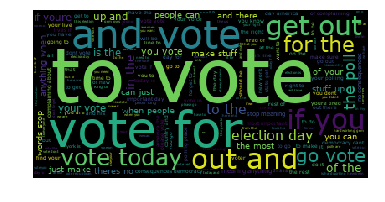

In [10]:
# MVP (made another submission)

from wordcloud import WordCloud, STOPWORDS 

def generate_wordcloud(text): # optionally add: stopwords=STOPWORDS and change the arg below
    wordcloud = WordCloud(font_path='/Library/Fonts/Verdana.ttf',
                          relative_scaling = 1,
                          stopwords = {'english'} # set or space-separated string
                          ).generate(text)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

generate_wordcloud(s) # not sure why this is returning bigrams

In [8]:
%pylab inline
import numpy 
import matplotlib.pyplot as plt
import sklearn
# Import all of the scikit learn stuff
from __future__ import print_function
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer 
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.preprocessing import Normalizer
from sklearn import metrics
from sklearn.cluster import KMeans, MiniBatchKMeans
import pandas as pd
from sklearn.decomposition import NMF

Populating the interactive namespace from numpy and matplotlib


/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['e']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [9]:
tweet_body_list=[]
for tweet in tweet_df['Tweet body']:
    tweet_body_list.append(tweet)

In [10]:
tweet_body_list=list(set(tweet_body_list)) # Remove duplicate tweets (mostly retweets).
len(tweet_body_list)

8912

In [11]:
# Run new tweet list through Count Vectorizer.

vectorizer = CountVectorizer(min_df = 1, stop_words = 'english', token_pattern='\\b[a-z][a-z]+\\b')
cv_fit = vectorizer.fit_transform(tweet_body_list) 
pd.DataFrame(cv_fit.toarray(), index=tweet_body_list, columns=vectorizer.get_feature_names()).head(10)

,aaa,aaaah,abandon,abandoning,abdullahi,abhorrent,abiding,abilene,ability,able,...,yucky,yup,zed,zero,zinke,zion,zip,ziploc,zodiac,zuppas
,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
vote red vote red damn florida i live here vote red,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
what were thinking when someone eligible tells us theyre refusing to go vote,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
kids are allowed to vote that must be illegal,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
wake up get up get out there go vote,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
so in other wordsyou are advocating for trumps kids to not be eligible to vote,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
tired of people saying you cant vote for what you want or youll split the vote just tell them theres a simple,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dear friends be sure to get out and vote today vote your values and know that we have been called to participate fully in our communities ps if you are,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
get up and vote,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dont let this bully intimidate you voting is your right if anyone gives you trouble at the polls call our vote,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
# Run CV through LSA for two topics.
lsa_cv = TruncatedSVD(2, algorithm = 'randomized')
cv_fit_lsa = lsa_cv.fit_transform(cv_fit)
cv_fit_lsa = Normalizer(copy=False).fit_transform(cv_fit_lsa)

In [13]:
lsa_cv.explained_variance_ratio_

array([0.06500341, 0.02278742])

In [14]:
pd.DataFrame(lsa_cv.components_.round(5),index = ["component_1","component_2"],columns = vectorizer.get_feature_names())

,aaa,aaaah,abandon,abandoning,abdullahi,abhorrent,abiding,abilene,ability,able,...,yucky,yup,zed,zero,zinke,zion,zip,ziploc,zodiac,zuppas
component_1,0.00036,0.00008,0.00008,0.00007,0.0,0.00007,0.00036,0.00001,0.00086,0.00771,...,0.00008,0.00049,0.00007,0.00029,0.0,0.00007,0.00007,0.00000,0.00021,0.00007
component_2,0.00034,0.00007,0.00004,0.00010,-0.0,0.00010,0.00003,-0.00000,-0.00079,-0.00049,...,0.00007,0.00076,0.00011,0.00041,-0.0,0.00011,0.00011,-0.00001,0.00035,0.00007


In [ ]:
# Sort tweets by scores on topic.

In [15]:
pd.DataFrame(cv_fit_lsa.round(5), index = tweet_body_list, columns = ["component_1","component_2"]).sort_values('component_2',0)

,component_1,component_2
no excusesgtvote,-0.00001,-1.00000
noexcuses,0.00001,-1.00000
was always 💖💛💚💙💜mrrpmurphy,0.00002,-1.00000
today art by johanna bjork,0.17892,-0.98386
do i get to for kanye or waka flocka today😏,0.17891,-0.98386
do it today 🇺🇸,0.17897,-0.98385
and today,0.17897,-0.98385
very nicely done today on your us homepage,0.17900,-0.98385
get out today,0.17897,-0.98385
all of this today,0.17897,-0.98385


In [16]:
# Run tweets through TF-IDF.

tfidf = TfidfVectorizer(stop_words='english', token_pattern='\\b[a-z][a-z]+\\b')
tfidf_fit = tfidf.fit_transform(tweet_body_list)
df_tfidf=pd.DataFrame(tfidf_fit.toarray(), index=tweet_body_list, columns=tfidf.get_feature_names())

In [16]:
# Check TF-IDF results on most common words in tweets.
df_tfidf_topwords=df_tfidf[['vote', 'today', 'day', 'dont', 'people', 'make', 'election', 
        'voting', 'just', 'polls', 'voted', 'youre', 'like', 'america',
        'electionday']]
df_tfidf_topwords

,vote,today,day,dont,people,make,election,voting,just,polls,voted,youre,like,america,electionday
,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
even though hes 💥lost the 💥race it still 💥blows my 💥mind 💥dims in 💥minnesota chose 💥ellison to 💥run as,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
my request is very simple if we vote we win day to,0.098630,0.000000,0.272616,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
me on my way to the polls today to vote every last republican out of office,0.120052,0.257439,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.387129,0.000000,0.0,0.000000,0.000000,0.0
ur dumb shutup and get your lazy ass out of bed and go vote,0.068686,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
if potus thought we would lose the midterms do you really think he would wait to drop the moab patriots are in control,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
just voted in dover ward with my wife cindy please remember that this election will be extremely close and every,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.176496,0.000000,0.180297,0.000000,0.189988,0.0,0.000000,0.000000,0.0
reject useless racial virtue signaling vote for the policies that will help america vote red,0.110995,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.209028,0.0
you have my heart and prayer i grew up in tucson and my parents are still in that valley god,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
its fun to make jokes about voting but voting every republican out of office is no joke please vote against the,0.070922,0.000000,0.000000,0.000000,0.000000,0.212849,0.000000,0.407304,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0


In [17]:
# Run TF-IDF through LSA for two topics.
lsa_tfidf = TruncatedSVD(2, algorithm = 'randomized')
tfidf_lsa = lsa_tfidf.fit_transform(tfidf_fit)
tfidf_lsa = Normalizer(copy=False).fit_transform(tfidf_lsa)

In [18]:
lsa_tfidf.explained_variance_ratio_

array([0.01487525, 0.01107611])

In [19]:
pd.DataFrame(lsa_tfidf.components_.round(5),index = ["component_1","component_2"], columns = vectorizer.get_feature_names())

,aaa,aaaah,abandon,abandoning,abdullahi,abhorrent,abiding,abilene,ability,able,...,yucky,yup,zed,zero,zinke,zion,zip,ziploc,zodiac,zuppas
component_1,0.00044,0.00031,0.00010,0.00008,0.00001,0.00007,0.00056,0.00004,0.00134,0.01546,...,0.00007,0.00056,0.00009,0.00057,0.0,0.00010,0.00003,0.00001,0.00016,0.00009
component_2,0.00004,-0.00004,-0.00002,-0.00007,0.00000,-0.00006,-0.00010,0.00004,0.00098,0.00337,...,-0.00001,-0.00059,-0.00007,-0.00041,0.0,-0.00007,-0.00003,0.00002,-0.00015,-0.00004


In [20]:
# Run CV through NMF for five topics.
nmf_cv = NMF(5)
cv_fit_nmf = nmf_cv.fit_transform(cv_fit)
cv_fit_nmf = Normalizer(copy=False).fit_transform(cv_fit_nmf)

In [21]:
components_df=pd.DataFrame(nmf_cv.components_.round(5),index = ["component_1","component_2","component_3","component_4","component_5"],columns = vectorizer.get_feature_names())

In [28]:
# Examine words by topics matrix.

In [31]:
components_df.T

,component_1,component_2,component_3,component_4,component_5
aaa,0.00352,0.00000,0.00379,0.00000,0.00026
aaaah,0.00000,0.00000,0.00494,0.00000,0.00000
abandon,0.00000,0.00000,0.00436,0.00000,0.00179
abandoning,0.00085,0.00000,0.00000,0.00000,0.00000
abdullahi,0.00000,0.00000,0.00005,0.00000,0.00020
abhorrent,0.00076,0.00000,0.00000,0.00000,0.00061
abiding,0.00404,0.00109,0.00000,0.00000,0.00000
abilene,0.00000,0.00000,0.00000,0.00000,0.00094
ability,0.00415,0.00545,0.01600,0.00000,0.00586
able,0.07670,0.00257,0.00669,0.02991,0.02727


In [22]:
# Run TF-IDF through NMF for five topics.
nmf_tfidf = NMF(5)
tfidf_fit_nmf = nmf_tfidf.fit_transform(tfidf_fit)
tfidf_fit_nmf = Normalizer(copy=False).fit_transform(tfidf_fit_nmf)

In [25]:
nmf_cv.components_

array([[0.00351575, 0.        , 0.        , ..., 0.        , 0.00256134,
        0.00028862],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00378656, 0.00494026, 0.00435655, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.00012428, 0.        ,
        0.        ],
       [0.00025789, 0.        , 0.00178849, ..., 0.00011383, 0.00017117,
        0.00282705]])

In [26]:
nmf_tfidf.components_

array([[3.14546985e-04, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 7.80109921e-04, 3.32670769e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.88908751e-03, 5.00691093e-03, 1.99874311e-03, ...,
        4.61569250e-05, 2.53801604e-04, 3.01588039e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.16484446e-04, 0.00000000e+00, 1.31938302e-04],
       [3.26659333e-03, 7.29947775e-04, 0.00000000e+00, ...,
        1.04840866e-04, 0.00000000e+00, 9.70631928e-06]])

In [27]:
lsa_cv.components_

array([[ 3.59444422e-04,  7.64879018e-05,  7.77340137e-05, ...,
         1.31617951e-06,  2.12272910e-04,  7.31130503e-05],
       [ 3.43308786e-04,  7.46082972e-05,  4.07103478e-05, ...,
        -5.15899765e-06,  3.47476490e-04,  6.68299132e-05]])

In [28]:
lsa_tfidf.components_

array([[ 4.39646369e-04,  3.13254465e-04,  9.73305682e-05, ...,
         1.41692767e-05,  1.59846213e-04,  9.24442670e-05],
       [ 4.09127738e-05, -4.28297371e-05, -2.24542404e-05, ...,
         1.77663303e-05, -1.45730847e-04, -3.82565052e-05]])

In [29]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix+1)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [30]:
display_topics(nmf_cv,vectorizer.get_feature_names(),10)


Topic  1
vote, right, like, republican, yall, time, im, red, did, just

Topic  2
today, make, sure, red, voted, polls, voice, important, heard, remember

Topic  3
dont, forget, want, know, like, let, youre, care, just, complain

Topic  4
day, election, make, polls, polling, happy, todays, youre, open, sure

Topic  5
people, voting, just, im, right, voted, like, time, know, make


In [ ]:
# Check shape of matrices that need to be multiplied.

In [23]:
cv_fit

<8912x10518 sparse matrix of type '<class 'numpy.int64'>'
	with 73553 stored elements in Compressed Sparse Row format>

In [24]:
nmf_cv.components_.shape # This one needs to be transposed.

(5, 10518)

In [32]:
# Multiply document-term and term-topic matrices to get document-topic matrix.
doc_topic = np.asarray(cv_fit * np.asmatrix(nmf_cv.components_).T) 
X = pd.DataFrame(doc_topic.round(4), index=tweet_body_list, columns=['topic_1','topic_2','topic_3','topic_4','topic_5'])

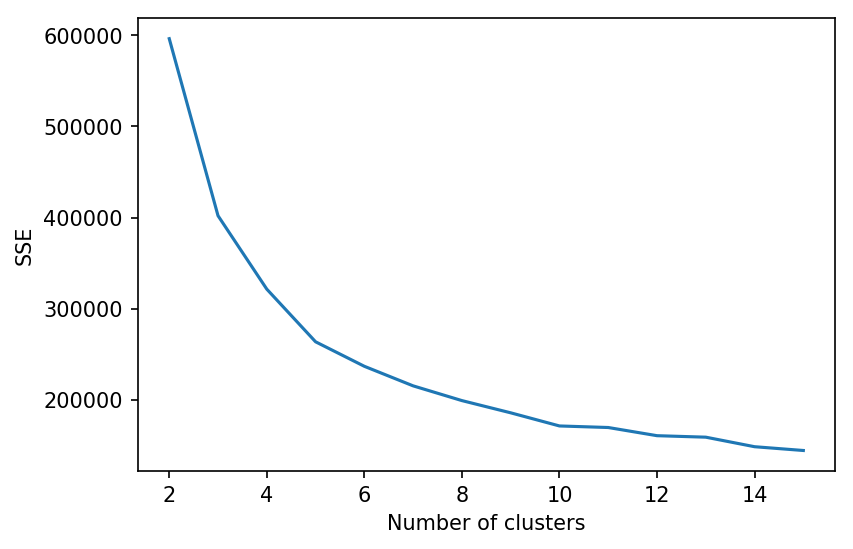

In [33]:
# Run through several k-means to find optimal k for clustering.
SSEs = []
for k in range(2,16):
    SSE=0
    for rs in range(0,50):
        km = MiniBatchKMeans(n_clusters=k, random_state=rs)
        km.fit(X)
        labels = km.labels_
        SSE += km.inertia_
    SSEs.append(SSE/50) 
    
plt.figure(dpi=150)    
plt.xlabel("Number of clusters")  
plt.ylabel("SSE")
plt.plot(range(2,16), SSEs);

In [ ]:
# k=6 looks reasonable.

In [34]:
km = MiniBatchKMeans(n_clusters=6)
clusts = km.fit_predict(X)

In [52]:
clusts.shape

(8912,)

In [35]:
# Use PCA to transform 5D topic space into 3D for visualization.
from sklearn.decomposition import PCA

reducer = PCA(n_components = 3) 
reduced_X = reducer.fit_transform(X)

In [38]:
df_PCA=pd.DataFrame(reduced_X, index=tweet_body_list, columns=['PCA_1','PCA_2','PCA_3'])

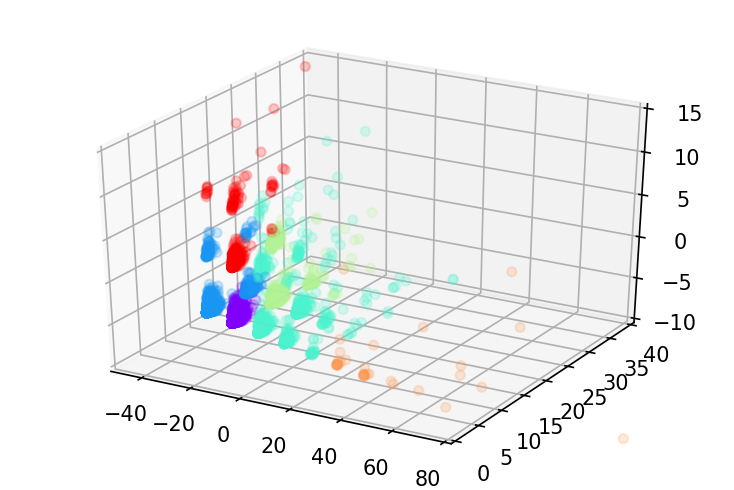

In [50]:
from mpl_toolkits.mplot3d import Axes3D

df_PCA['3D']= df_PCA.apply(lambda row: (row['PCA_1'],row['PCA_2'],row['PCA_3']), axis=1)

fig = plt.figure(dpi=150)
ax = fig.gca(projection='3d')
ax.set_xlim(-50,80)
ax.set_ylim(0,40)
ax.set_zlim(-10,15)
ax.scatter(np.asarray(df_PCA['PCA_1']),np.asarray(df_PCA['PCA_2']),np.asarray(df_PCA['PCA_3']),c=clusts,cmap=plt.cm.rainbow,alpha=.2);